In [1]:
import pandas as pd 
import numpy as np
from matplotlib import pyplot as plt 
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
#Average daily income [$ american dollars]
#Income Inequality= [Gini coefficient from 0 to 100:= complete inequality]

avg_daily_income = pd.read_csv('./data/avg_daily_income_corrected.csv')
income_inequality = pd.read_csv('./data/income_inequality_full.csv')

In [3]:
#Democracy Index [0 to 100]
#Index of functioning government (EIU) [0 to 100]
democracy = pd.read_csv('./data/democracy_full.csv')
government = pd.read_csv('./data/government_full.csv')

In [4]:
# Women participation in parliament [%]
woman_parliament = pd.read_csv('./data/women_parliament_full.csv')

In [5]:
countries = pd.read_csv('./data/countries.csv')
population = pd.read_csv('./data/population_full.csv')

In [6]:
# Happiness score (from the Happiness world report)[0 to 100]
happiness = pd.read_csv('./data/happiness_score_full.csv')

In [7]:
year_columns = ['2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019']
happiness['avg_score'] = happiness[year_columns].mean(axis=1, skipna=True)
happiness

,country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,country_code,continent,avg_score
0,Afghanistan,NaN,NaN,NaN,37.2,44.0,47.6,38.3,37.8,35.7,31.3,39.8,42.2,26.6,26.9,25.7,AFG,Asia,36.091667
1,Angola,NaN,NaN,NaN,NaN,NaN,NaN,55.9,43.6,39.4,37.9,NaN,NaN,NaN,NaN,NaN,AGO,Africa,44.200000
2,Albania,NaN,NaN,46.3,NaN,54.9,52.7,58.7,55.1,45.5,48.1,46.1,45.1,46.4,50.0,48.8,ALB,Europe,49.808333
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AND,Europe,NaN
4,United Arab Emirates,NaN,67.3,NaN,NaN,68.7,71.0,71.2,72.2,66.2,65.4,65.7,68.3,70.4,66.0,67.9,ARE,Asia,68.358333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WSM,Australia and Oceania,NaN
193,Yemen,NaN,NaN,44.8,NaN,48.1,43.5,37.5,40.6,42.2,39.7,29.8,38.3,32.5,30.6,35.3,YEM,Asia,38.575000
194,South Africa,NaN,50.8,52.0,53.5,52.2,46.5,49.3,51.3,36.6,48.3,48.9,47.7,45.1,48.8,48.1,ZAF,Africa,48.507143
195,Zambia,NaN,48.2,40.0,47.3,52.6,NaN,50.0,50.1,52.4,43.5,48.4,43.5,39.3,40.4,37.6,ZMB,Africa,45.638462


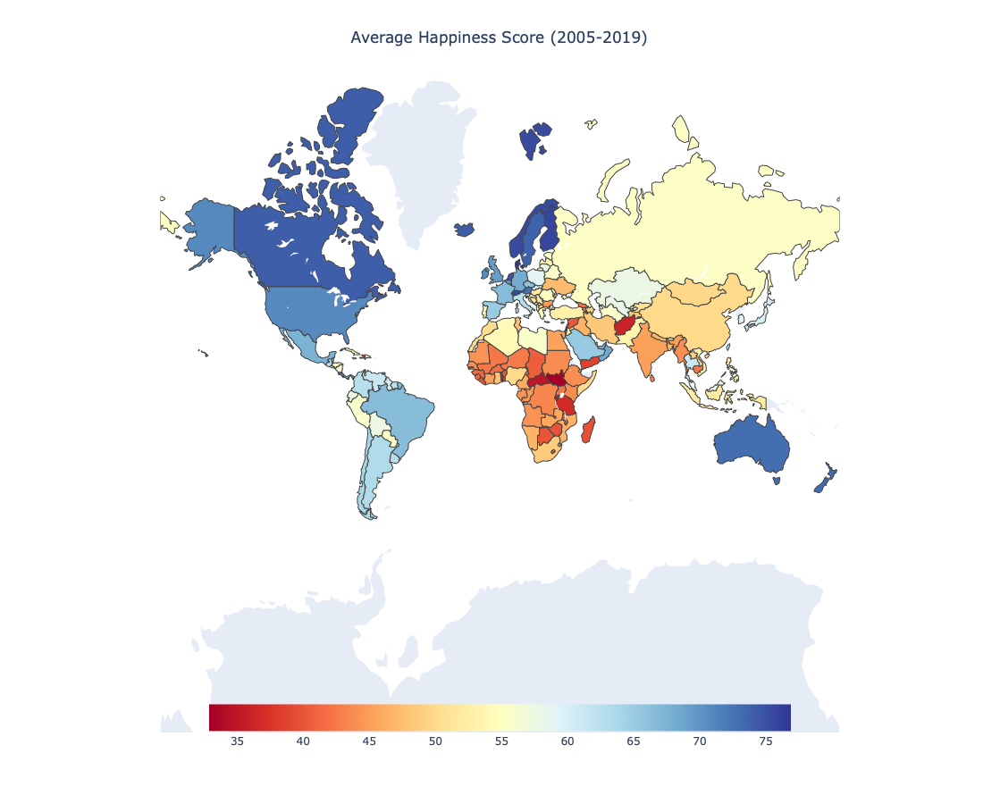

In [8]:
map_happiness = px.choropleth(happiness, locations="country_code",
                    color="avg_score", 
                    hover_name="country", 
                              labels={
                              'avg_score': ''
                          },
                    color_continuous_scale='RdYlBu',
                    projection="mercator")

map_happiness.update_layout(
    coloraxis_colorbar=dict(
        orientation="h",  # Set colorbar to horizontal
        x=0.5,  # Center the colorbar horizontally relative to the plot
        xanchor="center",
        y=-0.03,  # Position it below the plot
        yanchor="bottom",
        len=0.7  # Adjust the length of the colorbar (optional)
    ),
    title={
        'text': 'Average Happiness Score (2005-2019)',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    geo=dict(showframe=False, showcoastlines=False),
    height=900, 
    width=1100,
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
)

map_happiness.show()

In [9]:
# Reshape the DataFrame
df_long = pd.melt(happiness, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(2005, 2020)],
                  var_name='year', value_name='happiness_score')

# Check the first few rows to ensure it's reshaped correctly
df_long.head()

,country,country_code,continent,year,happiness_score
0,Afghanistan,AFG,Asia,2005,NaN
1,Angola,AGO,Africa,2005,NaN
2,Albania,ALB,Europe,2005,NaN
3,Andorra,AND,Europe,2005,NaN
4,United Arab Emirates,ARE,Asia,2005,NaN


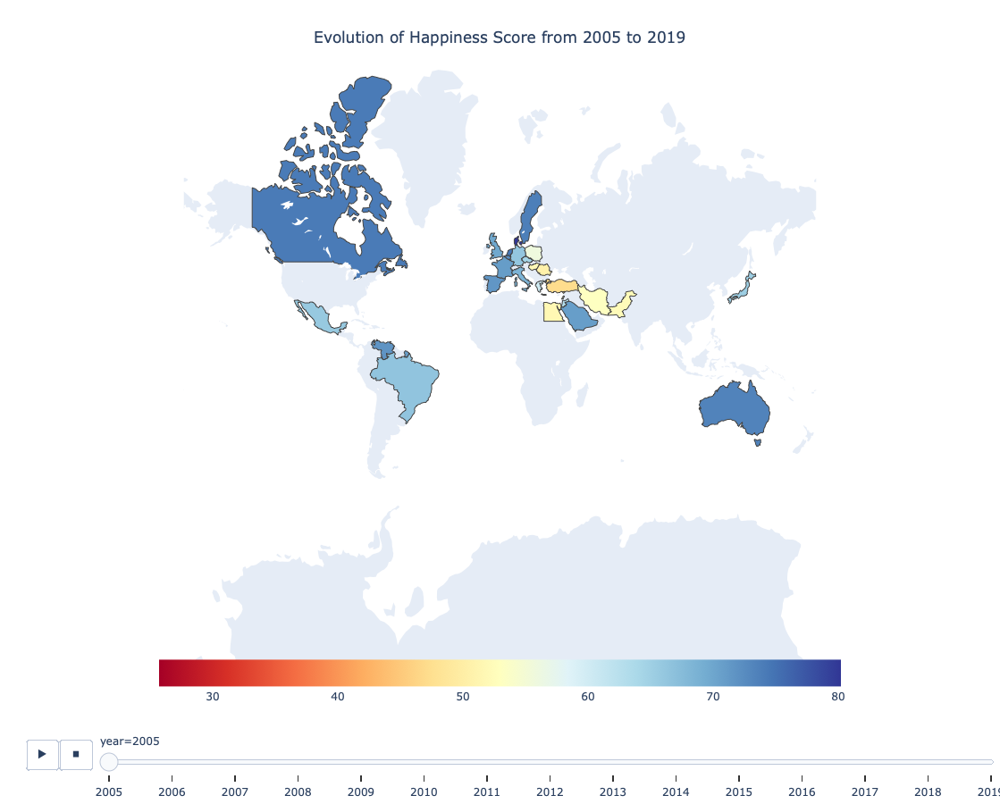

In [10]:
# Create the animated choropleth map
map_happiness = px.choropleth(df_long, 
                              locations="country_code",
                              color="happiness_score",
                              hover_name="country",
                              labels={
                              'happiness_score': ' '
                          },
                              animation_frame="year",
                              color_continuous_scale='RdYlBu',
                              range_color=[df_long['happiness_score'].min(), df_long['happiness_score'].max()],
                             projection='mercator')

map_happiness.update_layout(
    geo=dict(showframe=False, showcoastlines=False),
    margin=dict(t=50, l=0, r=0, b=0)
)

map_happiness.update_layout(
    coloraxis_colorbar=dict(
        orientation="h",  # Set colorbar to horizontal
        x=0.5,  # Center the colorbar horizontally relative to the plot
        xanchor="center",
        y=-0.05,  # Position it below the plot
        yanchor="bottom",
        len=0.7  # Adjust the length of the colorbar (optional)
    ),
    title={
        'text': 'Evolution of Happiness Score from 2005 to 2019',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,  

)

map_happiness.show()


### Let's observe some correlation with incomes

In [11]:
avg_daily_income.head()

,continent,country,country_code,1800,1801,1802,1803,1804,1805,1806,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Asia,Afghanistan,AFG,0.919,0.919,0.919,0.919,0.919,0.919,0.919,...,2.83,2.89,2.87,2.82,2.81,2.81,2.77,2.82,2.62,2.66
1,Africa,Angola,AGO,2.270,2.270,2.280,2.290,2.300,2.310,2.320,...,3.73,3.76,3.78,3.67,3.55,3.37,3.12,2.99,2.79,2.72
2,Europe,Albania,ALB,1.220,1.220,1.220,1.220,1.220,1.220,1.220,...,7.99,8.20,8.52,8.62,8.79,8.73,9.04,9.35,9.04,9.50
3,Europe,Andorra,AND,1.480,1.490,1.490,1.490,1.490,1.500,1.500,...,52.00,54.20,55.70,57.70,59.70,61.70,63.80,66.00,68.30,70.60
4,Asia,United Arab Emirates,ARE,2.900,2.910,2.920,2.930,2.940,2.950,2.960,...,70.40,73.60,83.70,69.10,71.20,78.70,84.10,94.00,85.80,85.80


In [12]:
# Reshape the DataFrame
avg_income_long = pd.melt(avg_daily_income, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(1800, 2020)],
                  var_name='year', value_name='avg_daily_income')

avg_income_long.head()

,country,country_code,continent,year,avg_daily_income
0,Afghanistan,AFG,Asia,1800,0.919
1,Angola,AGO,Africa,1800,2.270
2,Albania,ALB,Europe,1800,1.220
3,Andorra,AND,Europe,1800,1.480
4,United Arab Emirates,ARE,Asia,1800,2.900


In [13]:
income_inequality

,continent,country,country_code,1800,1801,1802,1803,1804,1805,1806,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
0,Asia,Afghanistan,AFG,30.5,30.5,30.5,30.5,30.5,30.5,30.5,...,37.7,37.7,37.7,37.7,37.7,37.7,37.7,37.7,38.3,39.0
1,Africa,Angola,AGO,57.7,57.7,57.7,57.7,57.7,57.7,57.7,...,46.0,46.8,47.7,48.5,49.4,50.3,51.3,51.3,52.1,53.0
2,Europe,Albania,ALB,39.9,39.9,39.9,39.9,39.9,39.9,39.9,...,29.0,31.6,34.6,32.9,33.7,33.2,33.2,33.2,33.8,34.5
3,Europe,Andorra,AND,42.5,42.5,42.5,42.5,42.5,42.5,42.5,...,35.5,35.4,35.4,35.3,35.2,35.2,35.1,35.0,35.0,35.0
4,Asia,United Arab Emirates,ARE,39.8,39.8,39.8,39.8,39.8,39.8,39.8,...,32.6,32.5,31.1,29.7,28.4,27.2,26.0,26.0,26.0,26.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,Australia and Oceania,Samoa,WSM,40.7,40.7,40.7,40.7,40.7,40.7,40.7,...,39.4,38.7,38.7,38.7,38.7,38.7,38.7,38.7,38.7,38.7
193,Asia,Yemen,YEM,49.8,49.8,49.8,49.8,49.8,49.8,49.8,...,36.3,36.5,36.7,36.7,36.7,36.7,36.7,36.7,37.5,38.5
194,Africa,South Africa,ZAF,35.2,35.2,35.2,35.2,35.2,35.2,35.2,...,63.2,63.1,63.0,62.7,63.0,63.3,63.3,63.3,64.0,64.9
195,Africa,Zambia,ZMB,52.1,52.1,52.1,52.1,52.1,52.1,52.1,...,56.2,56.5,56.8,57.1,57.1,57.1,57.1,57.1,57.9,58.9


In [14]:
# Reshape the DataFrame
income_inequality_long = pd.melt(income_inequality, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(1800, 2020)],
                  var_name='year', value_name='income_inequality')

income_inequality_long

,country,country_code,continent,year,income_inequality
0,Afghanistan,AFG,Asia,1800,30.5
1,Angola,AGO,Africa,1800,57.7
2,Albania,ALB,Europe,1800,39.9
3,Andorra,AND,Europe,1800,42.5
4,United Arab Emirates,ARE,Asia,1800,39.8
...,...,...,...,...,...
43335,Samoa,WSM,Australia and Oceania,2019,38.7
43336,Yemen,YEM,Asia,2019,36.7
43337,South Africa,ZAF,Africa,2019,63.3
43338,Zambia,ZMB,Africa,2019,57.1


In [15]:
df_income = pd.merge(avg_income_long, income_inequality_long, how='left', on=['country','country_code','continent','year'])
df_income

,country,country_code,continent,year,avg_daily_income,income_inequality
0,Afghanistan,AFG,Asia,1800,0.919,30.5
1,Angola,AGO,Africa,1800,2.270,57.7
2,Albania,ALB,Europe,1800,1.220,39.9
3,Andorra,AND,Europe,1800,1.480,42.5
4,United Arab Emirates,ARE,Asia,1800,2.900,39.8
...,...,...,...,...,...,...
43335,Samoa,WSM,Australia and Oceania,2019,10.600,38.7
43336,Yemen,YEM,Asia,2019,2.360,36.7
43337,South Africa,ZAF,Africa,2019,11.000,63.3
43338,Zambia,ZMB,Africa,2019,2.930,57.1


In [16]:
happiness_income = df_long.merge(df_income, how='left', on=['country','country_code','continent','year'])

In [17]:
population

,continent,country_code,country,1960,1961,1962,1963,1964,1965,1966,...,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,NaN,ABW,Aruba,54208.0,55434.0,56234.0,56699.0,57029.0,57357.0,57702.0,...,102050.0,102565.0,103165.0,103776.0,104339.0,104865.0,105361.0,105846.0,106310.0,106766.0
1,NaN,AFE,Africa Eastern and Southern,130836765.0,134159786.0,137614644.0,141202036.0,144920186.0,148769974.0,152752671.0,...,532760424.0,547482863.0,562601578.0,578075373.0,593871847.0,609978946.0,626392880.0,643090131.0,660046272.0,677243299.0
2,Asia,AFG,Afghanistan,8996967.0,9169406.0,9351442.0,9543200.0,9744772.0,9956318.0,10174840.0,...,30117411.0,31161378.0,32269592.0,33370804.0,34413603.0,35383028.0,36296111.0,37171922.0,38041757.0,38928341.0
3,NaN,AFW,Africa Western and Central,96396419.0,98407221.0,100506960.0,102691339.0,104953470.0,107289875.0,109701811.0,...,360285439.0,370243017.0,380437896.0,390882979.0,401586651.0,412551299.0,423769930.0,435229381.0,446911598.0,458803476.0
4,Africa,AGO,Angola,5454938.0,5531451.0,5608499.0,5679409.0,5734995.0,5770573.0,5781305.0,...,24220660.0,25107925.0,26015786.0,26941773.0,27884380.0,28842482.0,29816769.0,30809787.0,31825299.0,32866268.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
262,NaN,XKX,Kosovo,947000.0,966000.0,994000.0,1022000.0,1050000.0,1078000.0,1106000.0,...,1791000.0,1807106.0,1818117.0,1812771.0,1788196.0,1777557.0,1791003.0,1797085.0,1788878.0,1790133.0
263,Asia,YEM,"Yemen, Rep.",5315351.0,5393034.0,5473671.0,5556767.0,5641598.0,5727745.0,5816241.0,...,23807586.0,24473176.0,25147112.0,25823488.0,26497881.0,27168210.0,27834811.0,28498683.0,29161922.0,29825968.0
264,Africa,ZAF,South Africa,17099836.0,17524533.0,17965733.0,18423157.0,18896303.0,19384838.0,19888259.0,...,52003759.0,52832659.0,53687125.0,54544184.0,55386369.0,56207649.0,57009751.0,57792520.0,58558267.0,59308690.0
265,Africa,ZMB,Zambia,3070780.0,3164330.0,3260645.0,3360099.0,3463211.0,3570466.0,3681953.0,...,14023199.0,14465148.0,14926551.0,15399793.0,15879370.0,16363449.0,16853608.0,17351714.0,17861034.0,18383956.0


In [18]:
population_long = pd.melt(population, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(1960, 2020)],
                  var_name='year', value_name='population')

population_long

,country,country_code,continent,year,population
0,Aruba,ABW,NaN,1960,54208.0
1,Africa Eastern and Southern,AFE,NaN,1960,130836765.0
2,Afghanistan,AFG,Asia,1960,8996967.0
3,Africa Western and Central,AFW,NaN,1960,96396419.0
4,Angola,AGO,Africa,1960,5454938.0
...,...,...,...,...,...
16015,Kosovo,XKX,NaN,2019,1788878.0
16016,"Yemen, Rep.",YEM,Asia,2019,29161922.0
16017,South Africa,ZAF,Africa,2019,58558267.0
16018,Zambia,ZMB,Africa,2019,17861034.0


In [19]:
happiness_income = happiness_income.merge(population_long, how='left', on=['country','country_code','continent','year'])

In [20]:
happiness_income

,country,country_code,continent,year,happiness_score,avg_daily_income,income_inequality,population
0,Afghanistan,AFG,Asia,2005,NaN,1.760,37.7,25654274.0
1,Angola,AGO,Africa,2005,NaN,4.000,46.0,19433604.0
2,Albania,ALB,Europe,2005,NaN,7.700,30.6,3011487.0
3,Andorra,AND,Europe,2005,NaN,49.300,35.6,78871.0
4,United Arab Emirates,ARE,Asia,2005,NaN,0.187,32.0,4588222.0
...,...,...,...,...,...,...,...,...
2950,Samoa,WSM,Australia and Oceania,2019,NaN,10.600,38.7,197093.0
2951,Yemen,YEM,Asia,2019,35.3,2.360,36.7,NaN
2952,South Africa,ZAF,Africa,2019,48.1,11.000,63.3,58558267.0
2953,Zambia,ZMB,Africa,2019,37.6,2.930,57.1,17861034.0


In [21]:
happiness_income.sort_values(by=['country', 'year'])
# Apply forward fill within each country group
happiness_income['population'] = happiness_income.groupby('country')['population'].bfill().ffill()

#fillna(method='ffill') to forward-fill NaN values within each group. 
#The ffill method propagates the last valid observation to the next valid.

In [22]:
happiness_income.isnull().sum()

country                 0
country_code            0
continent               0
year                    0
happiness_score      1118
avg_daily_income      345
income_inequality     330
population              0
dtype: int64

In [23]:
# reorder the legend 

continent_order = ['North America', 'South America', 'Europe','Asia','Africa', 'Australia and Oceania']
happiness_income['continent'] = pd.Categorical(happiness_income['continent'], categories=continent_order, ordered=True)
happiness_income.sort_values(['year'
                              ,'continent'
                             ], inplace=True)

In [24]:
happiness_income_full = happiness_income
happiness_income_full.sort_values(by=['country', 'year'])

happiness_income_full['happiness_score'] = happiness_income_full.groupby('country')['happiness_score'].bfill().ffill()
happiness_income_full['avg_daily_income'] = happiness_income_full.groupby('country')['avg_daily_income'].bfill().ffill()
happiness_income_full['income_inequality'] = happiness_income_full.groupby('country')['income_inequality'].bfill().ffill()

In [25]:
continent_colors = {
    'Asia': '#FADCAA',  # Tomato
    'Africa': '#FBB345',  # SteelBlue
    'Europe': '#93A4C2',  # LimeGreen
    'North America': '#122981',  # Gold
    'South America': '#D89DAF',  # OrangeRed
    'Australia and Oceania': '#BF456B',  # BlueViolet
    'Europe, Asia': '#C3CCE2'  # DarkTurquoise
}


In [26]:
#dict for country colors

country_to_continent = {
    'Antigua and Barbuda': 'North America', 'Bahamas': 'North America', 'Belize': 'North America', 
    'Barbados': 'North America', 'Canada': 'North America', 'Costa Rica': 'North America', 
    'Cuba': 'North America', 'Dominica': 'North America', 'Dominican Republic': 'North America', 
    'Grenada': 'North America', 'Guatemala': 'North America', 'Honduras': 'North America', 
    'Haiti': 'North America', 'Jamaica': 'North America', 'Saint Kitts and Nevis': 'North America', 
    'Saint Lucia': 'North America', 'Mexico': 'North America', 'Nicaragua': 'North America', 
    'Panama': 'North America', 'El Salvador': 'North America', 'Trinidad and Tobago': 'North America', 
    'United States': 'North America', 'Saint Vincent and the Grenadines': 'North America',

    'Argentina': 'South America', 'Bolivia': 'South America', 'Brazil': 'South America', 
    'Chile': 'South America', 'Colombia': 'South America', 'Ecuador': 'South America', 
    'Guyana': 'South America', 'Peru': 'South America', 'Paraguay': 'South America', 
    'Suriname': 'South America', 'Uruguay': 'South America', 'Venezuela': 'South America', 

    'Albania': 'Europe', 'Andorra': 'Europe', 'Armenia': 'Europe', 'Austria': 'Europe', 
    'Azerbaijan': 'Europe', 'Belgium': 'Europe', 'Bulgaria': 'Europe', 'Bosnia and Herzegovina': 'Europe', 
    'Belarus': 'Europe', 'Switzerland': 'Europe', 'Cyprus': 'Europe', 'Czech Republic': 'Europe', 
    'Germany': 'Europe', 'Denmark': 'Europe', 'Spain': 'Europe', 'Estonia': 'Europe', 
    'Finland': 'Europe', 'France': 'Europe', 'United Kingdom': 'Europe', 'Georgia': 'Europe', 
    'Greece': 'Europe', 'Croatia': 'Europe', 'Hungary': 'Europe', 'Ireland': 'Europe', 
    'Iceland': 'Europe', 'Italy': 'Europe', 'Liechtenstein': 'Europe', 'Lithuania': 'Europe', 
    'Luxembourg': 'Europe', 'Latvia': 'Europe', 'Monaco': 'Europe', 'Moldova': 'Europe', 
    'Macedonia': 'Europe', 'Malta': 'Europe', 'Montenegro': 'Europe', 'Netherlands': 'Europe', 
    'Norway': 'Europe', 'Poland': 'Europe', 'Portugal': 'Europe', 'Romania': 'Europe', 
    'San Marino': 'Europe', 'Serbia': 'Europe', 'Slovakia': 'Europe', 'Slovenia': 'Europe', 
    'Sweden': 'Europe', 'Ukraine': 'Europe', 'Vatican City': 'Europe',

    'Angola': 'Africa', 'Burundi': 'Africa', 'Benin': 'Africa', 'Burkina': 'Africa', 
    'Botswana': 'Africa', 'Central African Republic': 'Africa', 'Ivory Coast': 'Africa', 
    'Cameroon': 'Africa', 'Congo, Democratic Republic of': 'Africa', 'Congo': 'Africa', 
    'Comoros': 'Africa', 'Cape Verde': 'Africa', 'Djibouti': 'Africa', 'Algeria': 'Africa', 
    'Egypt': 'Africa', 'Eritrea': 'Africa', 'Ethiopia': 'Africa', 'Gabon': 'Africa', 
    'Ghana': 'Africa', 'Guinea': 'Africa', 'Gambia': 'Africa', 'Guinea-Bissau': 'Africa', 
    'Equatorial Guinea': 'Africa', 'Kenya': 'Africa', 'Liberia': 'Africa', 'Libya': 'Africa', 
    'Lesotho': 'Africa', 'Morocco': 'Africa', 'Madagascar': 'Africa', 'Mali': 'Africa', 
    'Mozambique': 'Africa', 'Mauritania': 'Africa', 'Mauritius': 'Africa', 'Malawi': 'Africa', 
    'Namibia': 'Africa', 'Niger': 'Africa', 'Nigeria': 'Africa', 'Rwanda': 'Africa', 
    'Sudan': 'Africa', 'Senegal': 'Africa', 'Sierra Leone': 'Africa', 'Somalia': 'Africa', 
    'South Sudan': 'Africa', 'Sao Tome and Principe': 'Africa', 'Eswatini': 'Africa', 
    'Seychelles': 'Africa', 'Chad': 'Africa', 'Togo': 'Africa', 'Tunisia': 'Africa', 
    'Tanzania': 'Africa', 'Uganda': 'Africa', 'South Africa': 'Africa', 'Zambia': 'Africa', 
    'Zimbabwe': 'Africa',

    'Afghanistan': 'Asia', 'United Arab Emirates': 'Asia', 'Bangladesh': 'Asia', 'Bahrain': 'Asia', 
    'Brunei': 'Asia', 'Bhutan': 'Asia', 'China': 'Asia', 'Hong Kong, China': 'Asia', 
    'Indonesia': 'Asia', 'India': 'Asia', 'Iran': 'Asia', 'Iraq': 'Asia', 'Israel': 'Asia', 
    'Jordan': 'Asia', 'Japan': 'Asia', 'Kazakhstan': 'Asia', 'Kyrgyzstan': 'Asia', 
    'Cambodia': 'Asia', 'Korea, South': 'Asia', 'Kuwait': 'Asia', 'Laos': 'Asia', 
    'Lebanon': 'Asia', 'Sri Lanka': 'Asia', 'Maldives': 'Asia', 'Burma (Myanmar)': 'Asia', 
    'Mongolia': 'Asia', 'Malaysia': 'Asia', 'Nepal': 'Asia', 'Oman': 'Asia', 'Pakistan': 'Asia', 
    'Philippines': 'Asia', 'Korea, North': 'Asia', 'Palestine': 'Asia', 'Qatar': 'Asia', 
    'Saudi Arabia': 'Asia', 'Singapore': 'Asia', 'Syria': 'Asia', 'Thailand': 'Asia', 
    'Tajikistan': 'Asia', 'Turkmenistan': 'Asia', 'East Timor': 'Asia', 'Turkey': 'Asia', 
    'Taiwan': 'Asia', 'Uzbekistan': 'Asia', 'Vietnam': 'Asia', 'Yemen': 'Asia',

    'Australia': 'Australia and Oceania', 'Fiji': 'Australia and Oceania', 'Micronesia': 'Australia and Oceania', 
    'Kiribati': 'Australia and Oceania', 'Marshall Islands': 'Australia and Oceania', 'Nauru': 'Australia and Oceania', 
    'New Zealand': 'Australia and Oceania', 'Palau': 'Australia and Oceania', 'Papua New Guinea': 'Australia and Oceania', 
    'Solomon Islands': 'Australia and Oceania', 'Tonga': 'Australia and Oceania', 'Tuvalu': 'Australia and Oceania', 
    'Vanuatu': 'Australia and Oceania', 'Samoa': 'Australia and Oceania'
}

# Russia is a special case being a transcontinental country
country_to_continent['Russia'] = 'Europe, Asia'


country_colors = {}  

for country, continent in country_to_continent.items():
    if continent in continent_colors:
        country_colors[country] = continent_colors[continent]

In [27]:
country_colors

{'Antigua and Barbuda': '#122981',
 'Bahamas': '#122981',
 'Belize': '#122981',
 'Barbados': '#122981',
 'Canada': '#122981',
 'Costa Rica': '#122981',
 'Cuba': '#122981',
 'Dominica': '#122981',
 'Dominican Republic': '#122981',
 'Grenada': '#122981',
 'Guatemala': '#122981',
 'Honduras': '#122981',
 'Haiti': '#122981',
 'Jamaica': '#122981',
 'Saint Kitts and Nevis': '#122981',
 'Saint Lucia': '#122981',
 'Mexico': '#122981',
 'Nicaragua': '#122981',
 'Panama': '#122981',
 'El Salvador': '#122981',
 'Trinidad and Tobago': '#122981',
 'United States': '#122981',
 'Saint Vincent and the Grenadines': '#122981',
 'Argentina': '#D89DAF',
 'Bolivia': '#D89DAF',
 'Brazil': '#D89DAF',
 'Chile': '#D89DAF',
 'Colombia': '#D89DAF',
 'Ecuador': '#D89DAF',
 'Guyana': '#D89DAF',
 'Peru': '#D89DAF',
 'Paraguay': '#D89DAF',
 'Suriname': '#D89DAF',
 'Uruguay': '#D89DAF',
 'Venezuela': '#D89DAF',
 'Albania': '#93A4C2',
 'Andorra': '#93A4C2',
 'Armenia': '#93A4C2',
 'Austria': '#93A4C2',
 'Azerbaijan':

In [28]:
# reorder the legend 

continent_order = ['North America', 'South America', 'Europe', 'Africa', 'Asia', 'Australia and Oceania']
happiness_income_full['continent'] = pd.Categorical(happiness_income_full['continent'], categories=continent_order, ordered=True)
happiness_income_full.sort_values(['year'
                                   ,'continent'
                                  ], inplace=True)

In [29]:
happiness_income_full

,country,country_code,continent,year,happiness_score,avg_daily_income,income_inequality,population
7,Antigua and Barbuda,ATG,North America,2005,NaN,20.50,37.2,81462.0
18,Bahamas,BHS,North America,2005,NaN,38.30,44.0,889157.0
21,Belize,BLZ,North America,2005,64.5,9.74,53.0,283798.0
24,Barbados,BRB,North America,2005,64.5,17.30,44.5,276320.0
29,Canada,CAN,North America,2005,74.2,52.20,33.8,32243753.0
...,...,...,...,...,...,...,...,...
2933,Tonga,TON,Australia and Oceania,2019,73.0,11.00,37.6,104497.0
2937,Tuvalu,TUV,Australia and Oceania,2019,73.0,10.20,39.1,11655.0
2949,Vanuatu,VUT,Australia and Oceania,2019,73.0,4.82,37.6,299882.0
2950,Samoa,WSM,Australia and Oceania,2019,73.0,10.60,38.7,197093.0


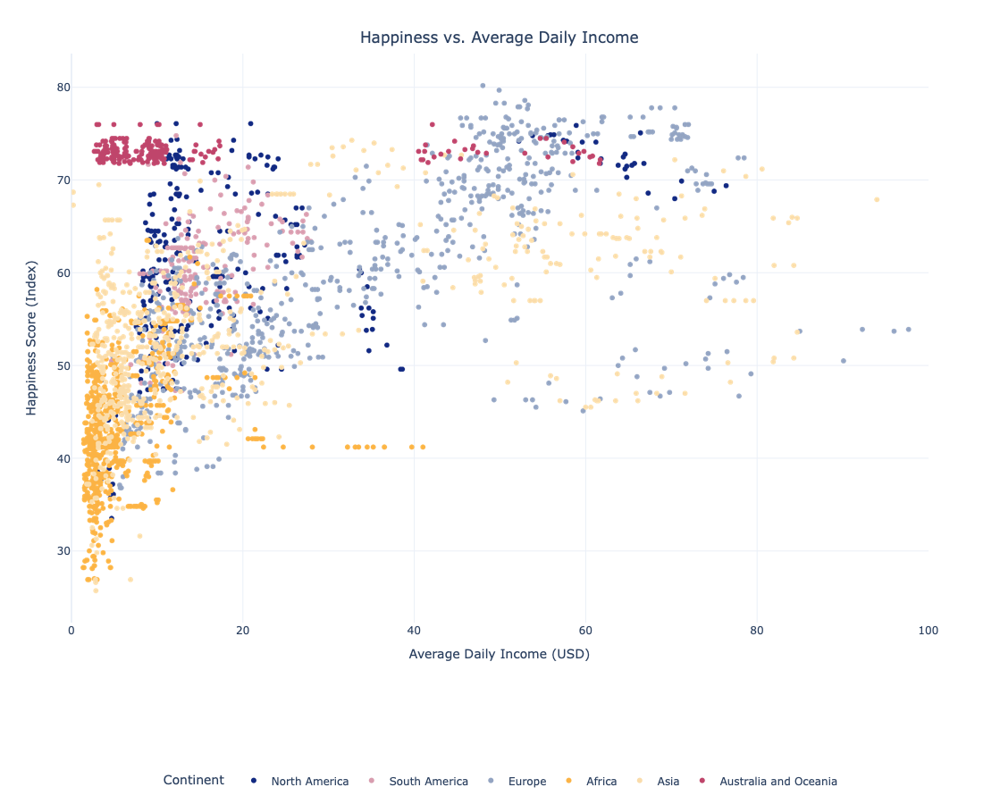

In [30]:
#with the actual data 

scatt_income = px.scatter(happiness_income,
                            x='avg_daily_income',
                            y='happiness_score',
                          labels={
                              'avg_daily_income': 'Average Daily Income (USD)',
                              'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            #size='population',
                          #size_max=50,
                            color='continent',
                             #animation_frame="year",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                        # range_y=[0,100],
                          range_x=[0,100])

scatt_income.update_layout(
    title={
        'text': 'Happiness vs. Average Daily Income',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=900,
    template='plotly_white',
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )

)

scatt_income.update_traces(marker=dict(size=6,
                              #line=dict(width=0.5,
                               #         color='DarkSlateGrey'),
                                      ))


#scatt_income.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

scatt_income.show()

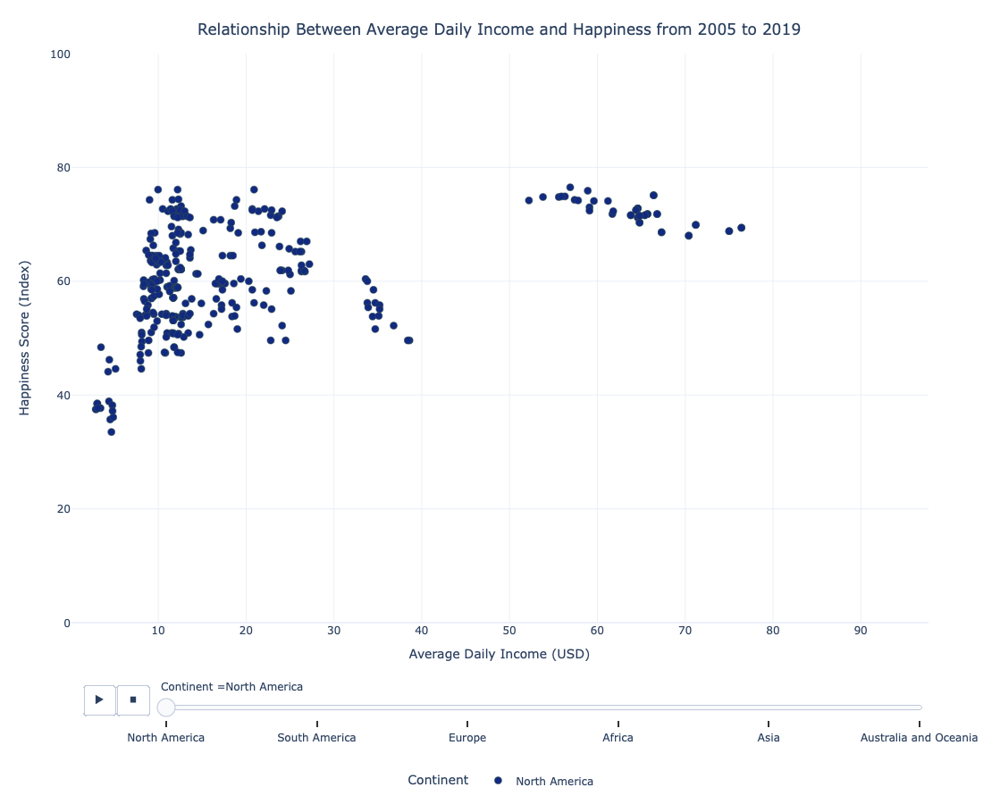

In [31]:
# With the filled data 

scatt_hap_income = px.scatter(happiness_income,
                            x='avg_daily_income',
                            y='happiness_score',
                            #size='population',
                          #size_max=50,
                          labels={
                              'avg_daily_income': 'Average Daily Income (USD)',
                              'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                             animation_frame="continent",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                         range_y=[0,100],
                        range_x=[happiness_income['avg_daily_income'].min(), happiness_income['avg_daily_income'].max()])

scatt_hap_income.update_layout(
    title={
        'text': 'Relationship Between Average Daily Income and Happiness from 2005 to 2019',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)

scatt_hap_income.update_traces(marker=dict(size=8,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_hap_income.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 3000

scatt_hap_income.show()

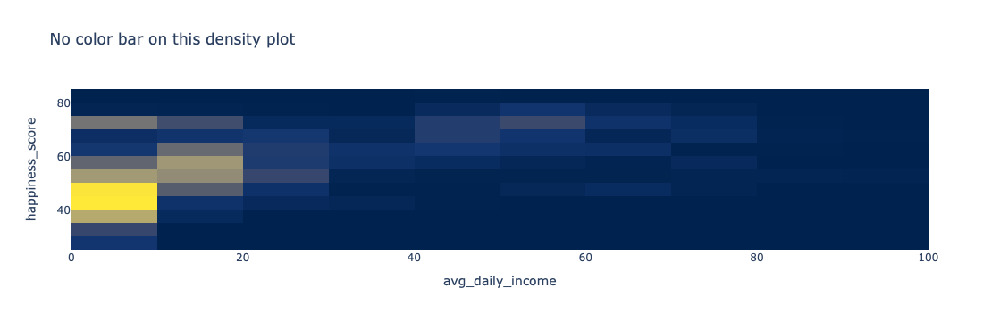

In [32]:
heat_avg_income = px.density_heatmap(happiness_income
                                     , x="avg_daily_income"
                                     , y="happiness_score"
                                     , title="No color bar on this density plot"
                                    ,color_continuous_scale='Cividis')

heat_avg_income.update_layout(coloraxis_showscale=False)

heat_avg_income.show()

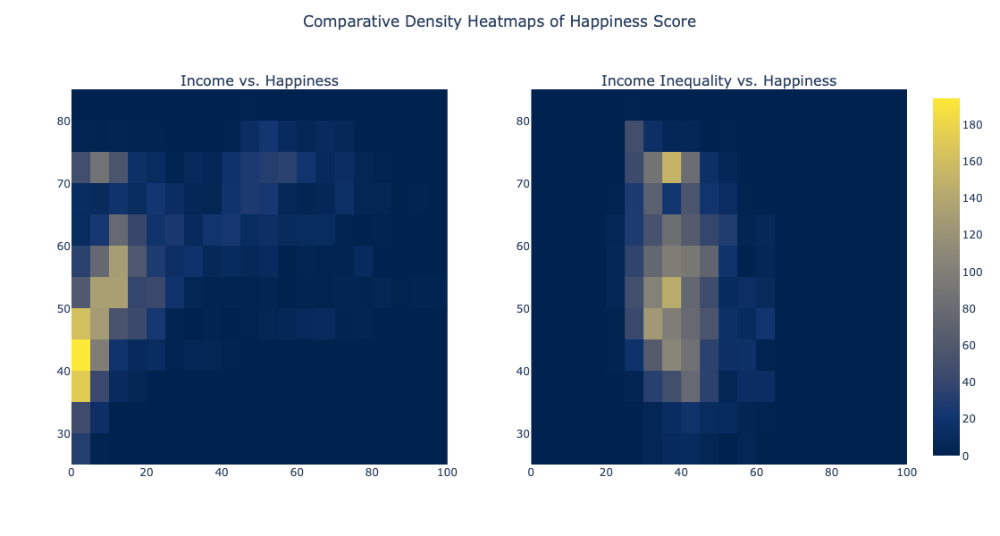

In [33]:
heatmap1 = px.density_heatmap(happiness_income, x="avg_daily_income", y="happiness_score"
                              ,title="Income vs. Happiness")
heatmap2 = px.density_heatmap(happiness_income, x="income_inequality", y="happiness_score", title="Inequality vs. Happiness")

heat_sub_income = make_subplots(rows=1, cols=2, subplot_titles=("Income vs. Happiness", "Income Inequality vs. Happiness", "Population vs. Happiness"))

for i, heatmap in enumerate([heatmap1, heatmap2], start=1):
    for trace in heatmap.data:
        heat_sub_income.add_trace(trace, row=1, col=i)

heat_sub_income.update_layout(coloraxis_showscale=False, coloraxis=dict(colorscale='Cividis', showscale=True)
                             )

heat_sub_income.update_layout(title={'text': 'Comparative Density Heatmaps of Happiness Score',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },height=600, width=1100)


heat_sub_income.show()


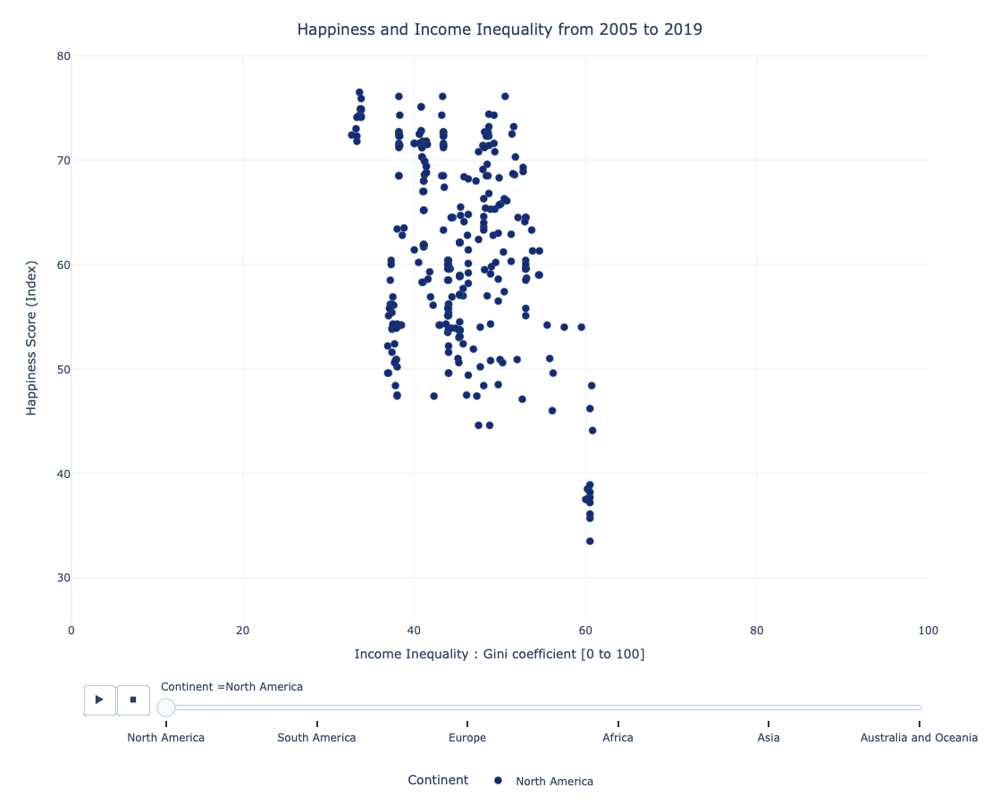

In [34]:
# income inequality, with 

scatt_ine_income = px.scatter(happiness_income,
                            x='income_inequality',
                            y='happiness_score',
                            #size='population',
                          #size_max=30,
                          labels={
                              'income_inequality': 'Income Inequality : Gini coefficient [0 to 100]',
                              'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                             animation_frame="continent",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                         range_y=[happiness_income['happiness_score'].min(), happiness_income['happiness_score'].max()],
                          range_x=[0,100])

scatt_ine_income.update_layout(
    title={
        'text': 'Happiness and Income Inequality from 2005 to 2019',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1000,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)

scatt_ine_income.update_traces(marker=dict(size=8,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_ine_income.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 3000

scatt_ine_income.show()

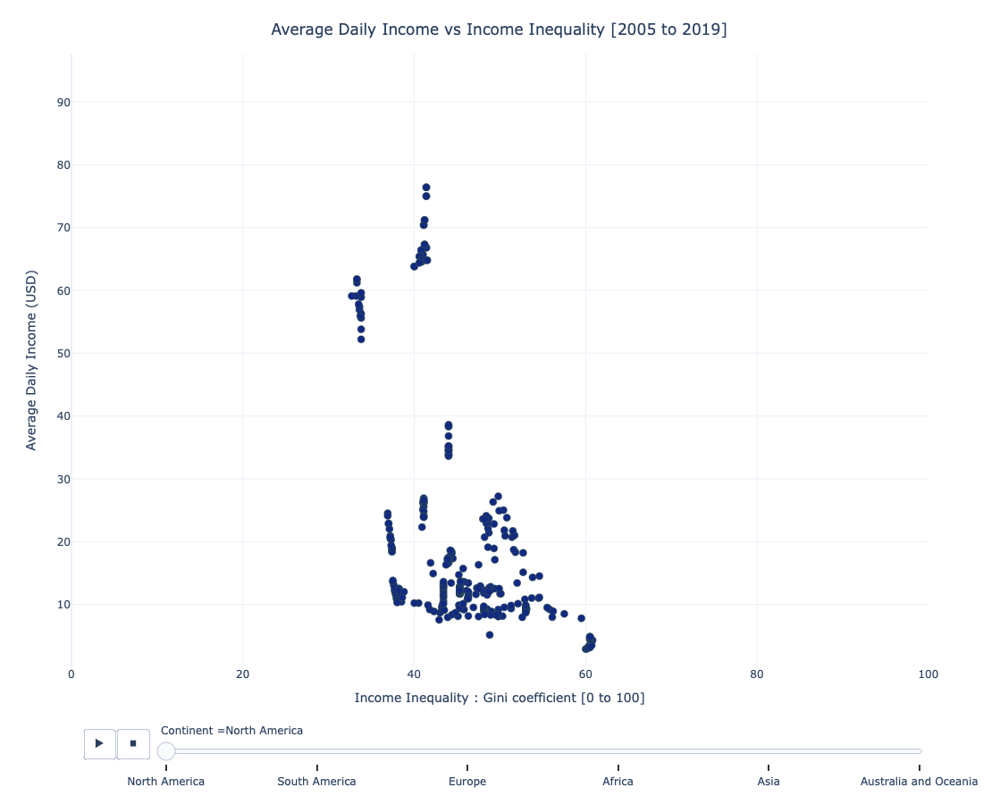

In [35]:
# With the filled data 

scatt_income = px.scatter(happiness_income,
                            x='income_inequality',
                            y='avg_daily_income',
                            #size='population',
                          #size_max=30,
                          labels={
                              'income_inequality': 'Income Inequality : Gini coefficient [0 to 100] ',
                              'avg_daily_income': 'Average Daily Income (USD) ',
                              'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                             animation_frame="continent",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                         range_y=[happiness_income['avg_daily_income'].min(), happiness_income['avg_daily_income'].max()],
                          range_x=[0,100]
                         )

scatt_income.update_layout(
    title={
        'text': 'Average Daily Income vs Income Inequality [2005 to 2019]',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    showlegend=False)




scatt_income.update_traces(marker=dict(size=8,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_income.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 3000

scatt_income.show()

In [36]:
#merging woman in parliament with countries
woman_parliament_long = pd.melt(woman_parliament, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(1945, 2020)],
                  var_name='year', value_name='women_parliament')
woman_parliament_long

,country,country_code,continent,year,women_parliament
0,Afghanistan,AFG,Asia,1945,NaN
1,Angola,AGO,Africa,1945,NaN
2,Albania,ALB,Europe,1945,3.66
3,Andorra,AND,Europe,1945,NaN
4,United Arab Emirates,ARE,Asia,1945,NaN
...,...,...,...,...,...
14545,Samoa,WSM,Australia and Oceania,2019,10.00
14546,Yemen,YEM,Asia,2019,0.97
14547,South Africa,ZAF,Africa,2019,45.30
14548,Zambia,ZMB,Africa,2019,18.00


In [37]:
#merging woman in parliament with happiness score
happiness_gouv = df_long.merge(woman_parliament_long, how='left', on=['country','country_code','continent','year'])

In [38]:
happiness_gouv

,country,country_code,continent,year,happiness_score,women_parliament
0,Afghanistan,AFG,Asia,2005,NaN,25.90
1,Angola,AGO,Africa,2005,NaN,32.10
2,Albania,ALB,Europe,2005,NaN,7.14
3,Andorra,AND,Europe,2005,NaN,32.10
4,United Arab Emirates,ARE,Asia,2005,NaN,2.50
...,...,...,...,...,...,...
2950,Samoa,WSM,Australia and Oceania,2019,NaN,10.00
2951,Yemen,YEM,Asia,2019,35.3,0.97
2952,South Africa,ZAF,Africa,2019,48.1,45.30
2953,Zambia,ZMB,Africa,2019,37.6,18.00


In [39]:
government

,country,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,country_code,continent
0,Afghanistan,0.0,3.95,7.9,7.9,7.9,7.9,7.9,7.9,11.4,11.4,11.4,11.4,11.4,6.4,6.4,AFG,Asia
1,Angola,21.4,26.80,32.1,32.1,32.1,32.1,32.1,32.1,32.1,32.1,32.1,28.6,28.6,28.6,28.6,AGO,Africa
2,Albania,50.7,50.70,50.7,50.7,50.7,47.1,40.0,40.0,40.0,43.6,43.6,47.1,47.1,53.6,53.6,ALB,Europe
3,Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AND,Europe
4,United Arab Emirates,30.7,35.00,39.3,37.5,35.7,35.7,35.7,35.7,35.7,35.7,35.7,35.7,39.3,39.3,39.3,ARE,Asia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,Samoa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,WSM,Australia and Oceania
193,Yemen,27.1,26.10,25.0,21.4,17.9,3.6,14.3,14.3,14.3,3.6,0.0,0.0,0.0,0.0,0.0,YEM,Asia
194,South Africa,78.6,78.60,78.6,80.3,82.1,82.1,82.1,82.1,82.1,82.1,78.6,75.0,75.0,75.0,71.4,ZAF,Africa
195,Zambia,46.4,46.40,46.4,50.0,53.6,50.0,53.6,53.6,53.6,53.6,53.6,50.0,46.4,29.3,29.3,ZMB,Africa


In [40]:
democracy_long = pd.melt(democracy, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(2006, 2020)],
                  var_name='year', value_name='democracy')

In [41]:
government_long = pd.melt(government, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(2006, 2020)],
                  var_name='year', value_name='functioning_government')

In [42]:
#adding democracy
happiness_gouv = happiness_gouv.merge(democracy_long, how='left', on=['country','country_code','continent','year'])

In [43]:
#adding index of functionning govermnent 
happiness_gouv = happiness_gouv.merge(government_long, how='left', on=['country','country_code','continent','year'])

In [44]:
happiness_gouv

,country,country_code,continent,year,happiness_score,women_parliament,democracy,functioning_government
0,Afghanistan,AFG,Asia,2005,NaN,25.90,NaN,NaN
1,Angola,AGO,Africa,2005,NaN,32.10,NaN,NaN
2,Albania,ALB,Europe,2005,NaN,7.14,NaN,NaN
3,Andorra,AND,Europe,2005,NaN,32.10,NaN,NaN
4,United Arab Emirates,ARE,Asia,2005,NaN,2.50,NaN,NaN
...,...,...,...,...,...,...,...,...
2950,Samoa,WSM,Australia and Oceania,2019,NaN,10.00,NaN,NaN
2951,Yemen,YEM,Asia,2019,35.3,0.97,19.5,0.0
2952,South Africa,ZAF,Africa,2019,48.1,45.30,72.4,75.0
2953,Zambia,ZMB,Africa,2019,37.6,18.00,50.9,29.3


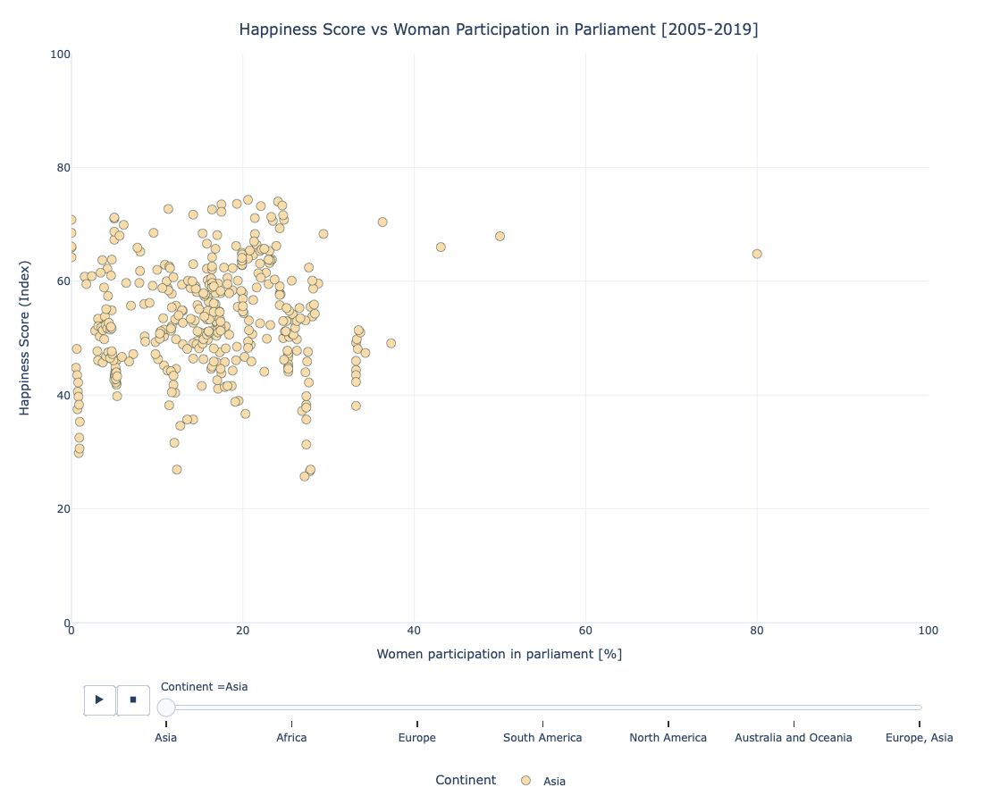

In [45]:
# With the missing values data 

scatt_happ_wom = px.scatter(happiness_gouv,
                            x='women_parliament',
                            y='happiness_score',
                            #size='population',
                          #size_max=30,
                          labels={
                               'women_parliament': 'Women participation in parliament [%]',
                              'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                             animation_frame="continent",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                         range_y=[0,100],
                          range_x=[0,100])

scatt_happ_wom.update_layout(
    title={
        'text': 'Happiness Score vs Woman Participation in Parliament [2005-2019]',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1000,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)

scatt_happ_wom.update_traces(marker=dict(size=10,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_happ_wom.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000
scatt_happ_wom.show()

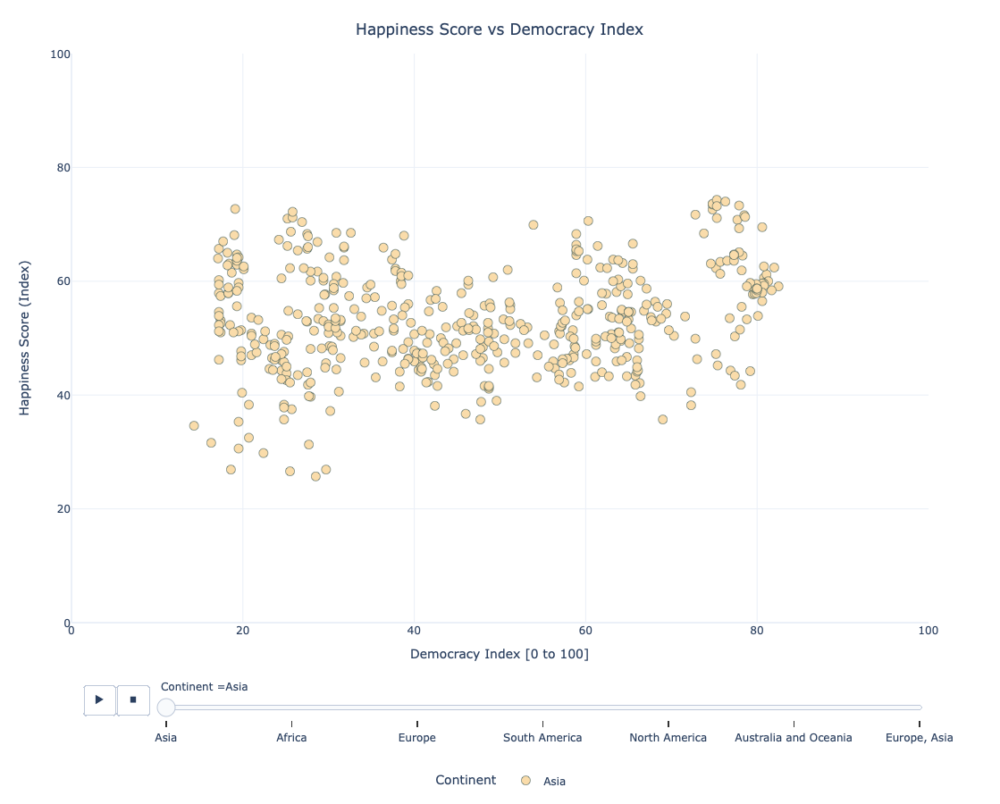

In [46]:
# With the missing values data 

scatt_dem = px.scatter(happiness_gouv,
                            x='democracy',
                            y='happiness_score',
                            #size='population',
                          #size_max=30,
                          labels={
                               'democracy': 'Democracy Index [0 to 100]',
                              'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                             animation_frame="continent",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                         range_y=[0,100],
                          range_x=[0,100])

scatt_dem.update_layout(
    title={
        'text': 'Happiness Score vs Democracy Index',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1000,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)

scatt_dem.update_traces(marker=dict(size=10,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_dem.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 3000

scatt_dem.show()

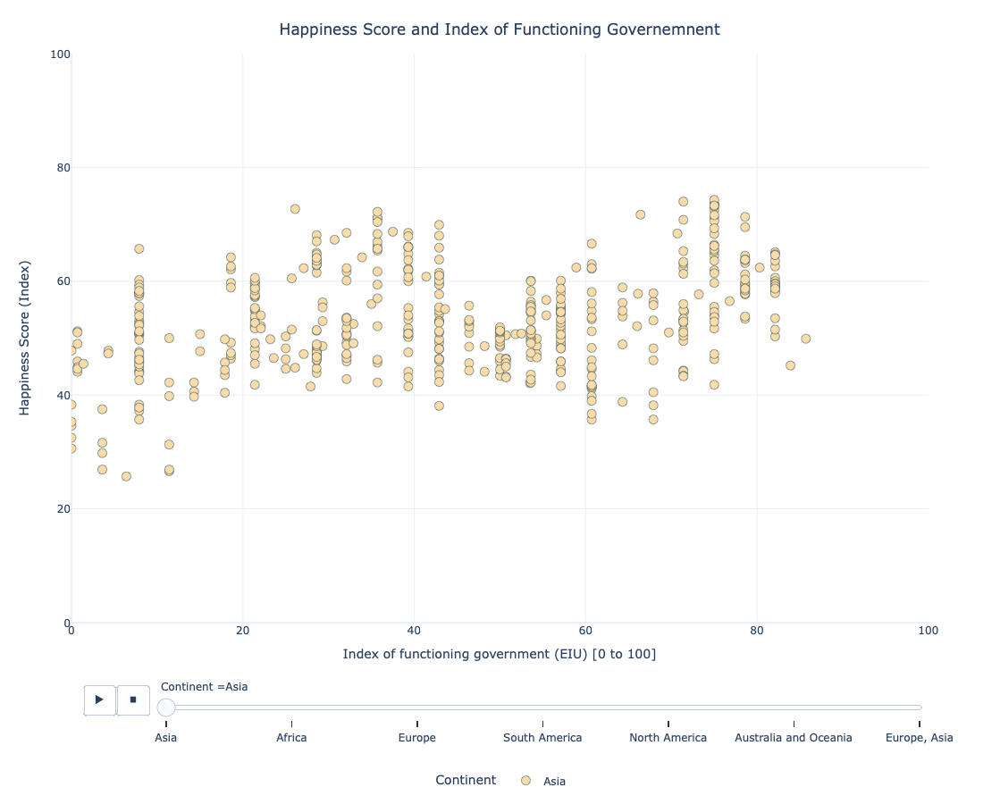

In [47]:
# With the missing values data 

scatt_hap_gov = px.scatter(happiness_gouv,
                            x='functioning_government',
                            y='happiness_score',
                            #size='population',
                          #size_max=30,
                          labels={
                               'functioning_government': 'Index of functioning government (EIU) [0 to 100]',
                              'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                             animation_frame="continent",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                         range_y=[0,100],
                          range_x=[0,100])

scatt_hap_gov.update_layout(
    title={
        'text': 'Happiness Score and Index of Functioning Governemnent',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1000,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)

scatt_hap_gov.update_traces(marker=dict(size=10,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_hap_gov.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 3000

scatt_hap_gov.show()

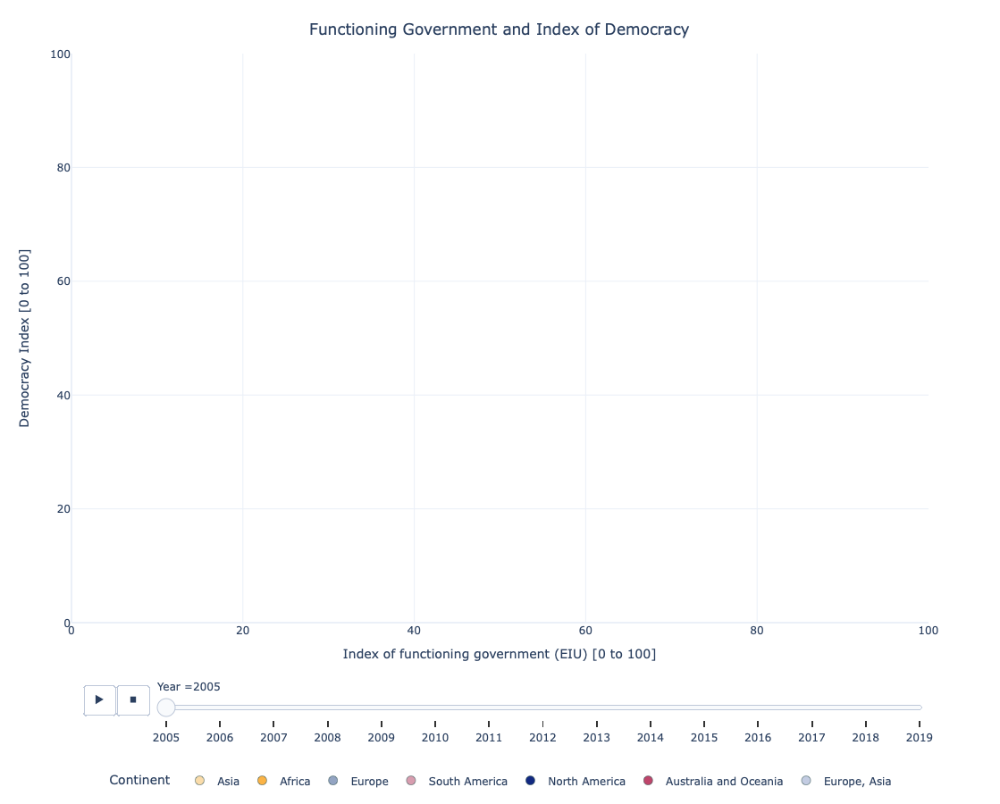

In [48]:
# With the missing values data 

scatt_gov_dem = px.scatter(happiness_gouv,
                            x='functioning_government',
                            y='democracy',
                            #size='population',
                          #size_max=30,
                          labels={
                               'functioning_government': 'Index of functioning government (EIU) [0 to 100]',
                              'democracy': 'Democracy Index [0 to 100]',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                             animation_frame="year",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                         range_y=[0,100],
                          range_x=[0,100])

scatt_gov_dem.update_layout(
    title={
        'text': 'Functioning Government and Index of Democracy',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1000,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)

scatt_gov_dem.update_traces(marker=dict(size=10,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_gov_dem.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

scatt_gov_dem.show()

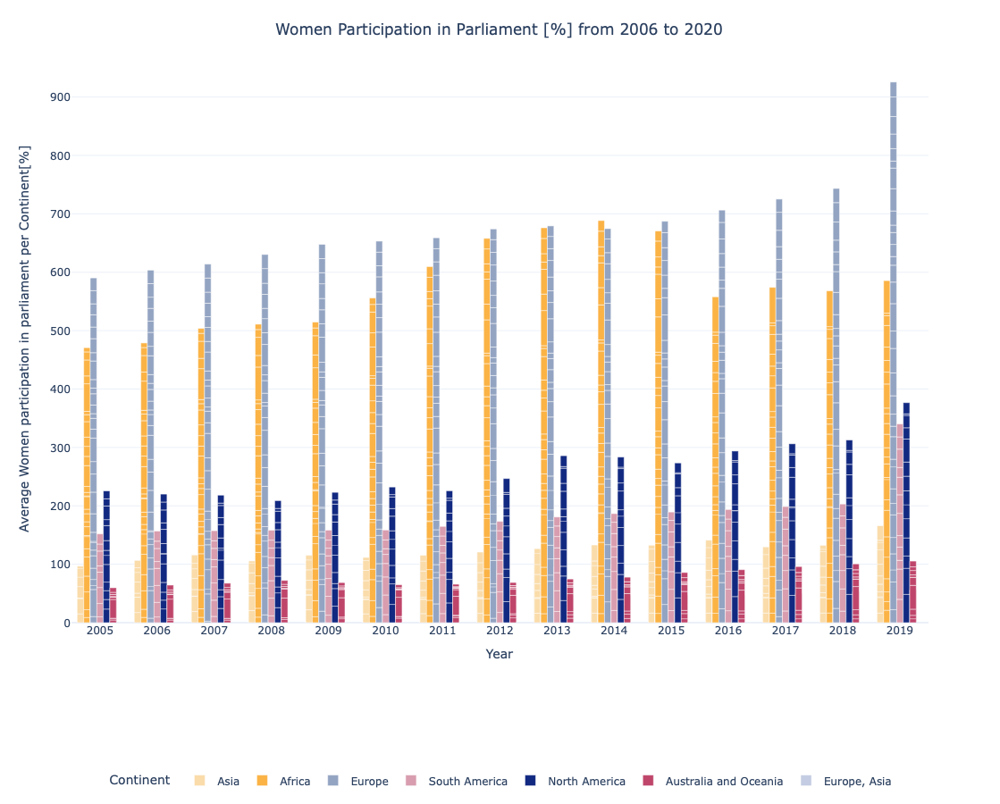

In [49]:
bar_wom = px.bar(happiness_gouv,
                        x='year',
                            y='women_parliament',
                          labels={
                                'women_parliament': 'Average Women participation in parliament per Continent[%]',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                          barmode='group',
                          color_discrete_map=continent_colors,
                          hover_name='country'
                         #,range_x=[0,10000]
                  )

bar_wom.update_layout(
    title={
        'text': 'Women Participation in Parliament [%] from 2006 to 2020',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
)



bar_wom.show()

In [50]:
average_participation = happiness_gouv.groupby(['year', 'continent']).agg({
    'women_parliament': ('mean'),  # Average women participation in parliament
    'happiness_score': ('mean')    # Average happiness score
}).reset_index()

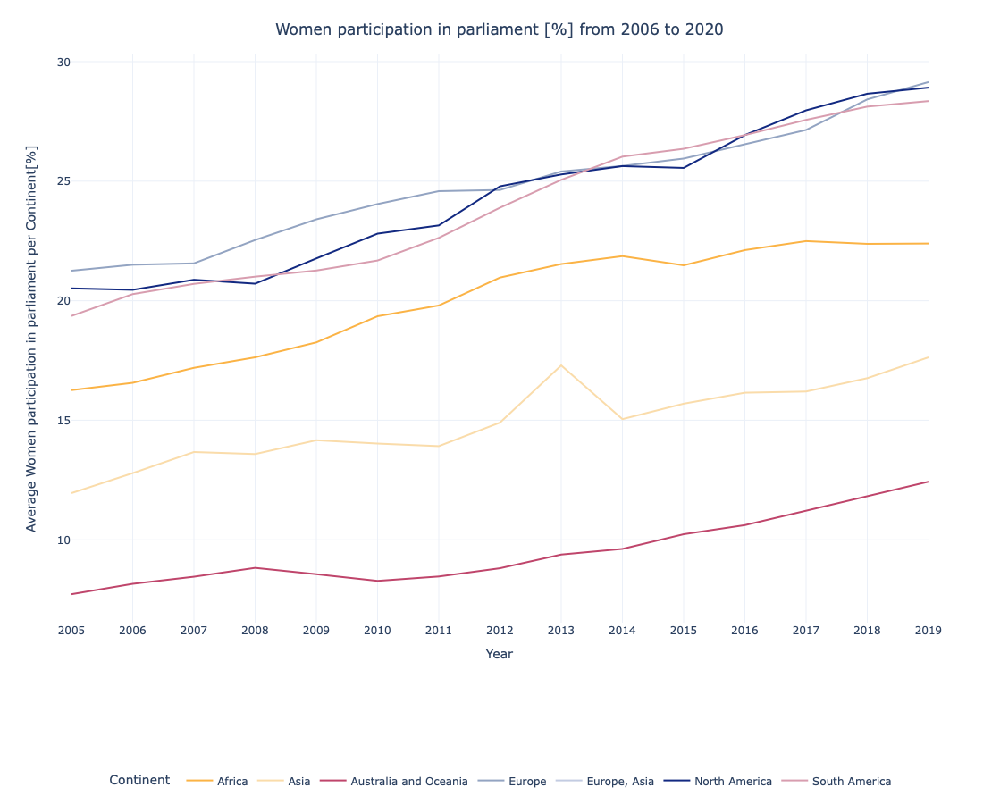

In [51]:
# With the missing values data but avg continent

line_wom = px.line(average_participation,
                            x='year',
                            y='women_parliament',
                          labels={
                                'women_parliament': 'Average Women participation in parliament per Continent[%]',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                          color_discrete_map=continent_colors,
                          #hover_name='country'
                         #,range_y=[0,100]
                  )

line_wom.update_layout(
    title={
        'text': 'Women participation in parliament [%] from 2006 to 2020',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)



line_wom.show()

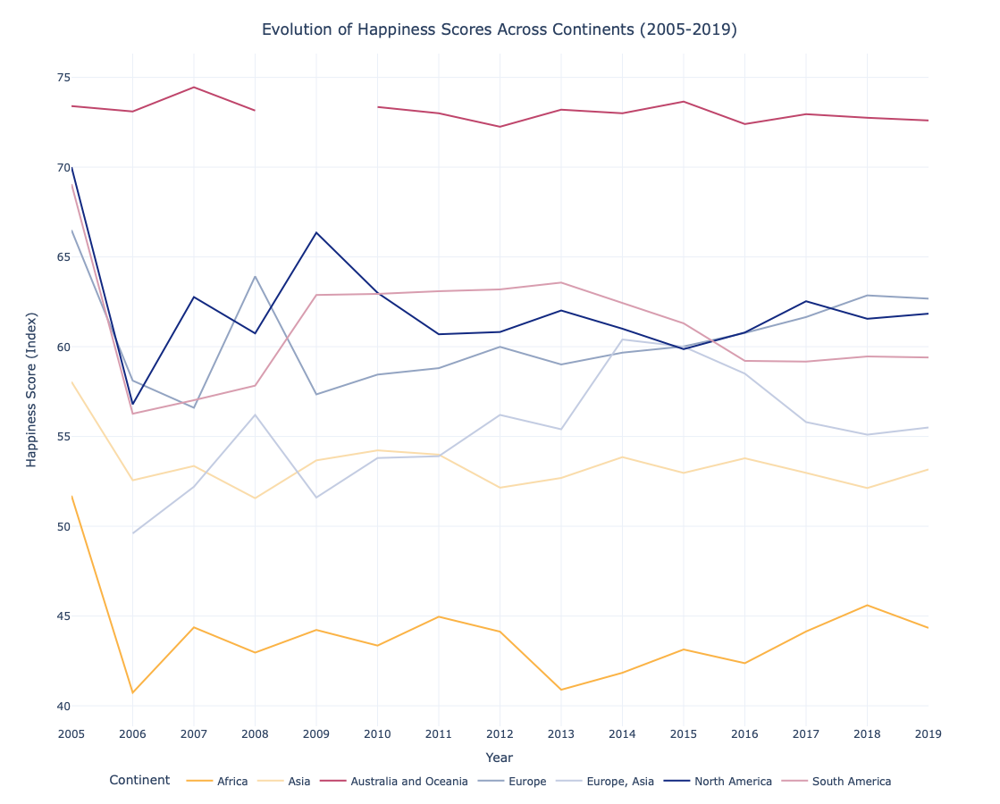

In [52]:
# With the missing values data but avg continent

line_happ = px.line(average_participation,
                            x='year',
                            y='happiness_score',
                          labels={
                                'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='continent',
                          color_discrete_map=continent_colors,
                          #hover_name='country'
                         #,range_y=[0,100]
                  )

line_happ.update_layout(
    title={
        'text': 'Evolution of Happiness Scores Across Continents (2005-2019)',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.1,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)



line_happ.show()

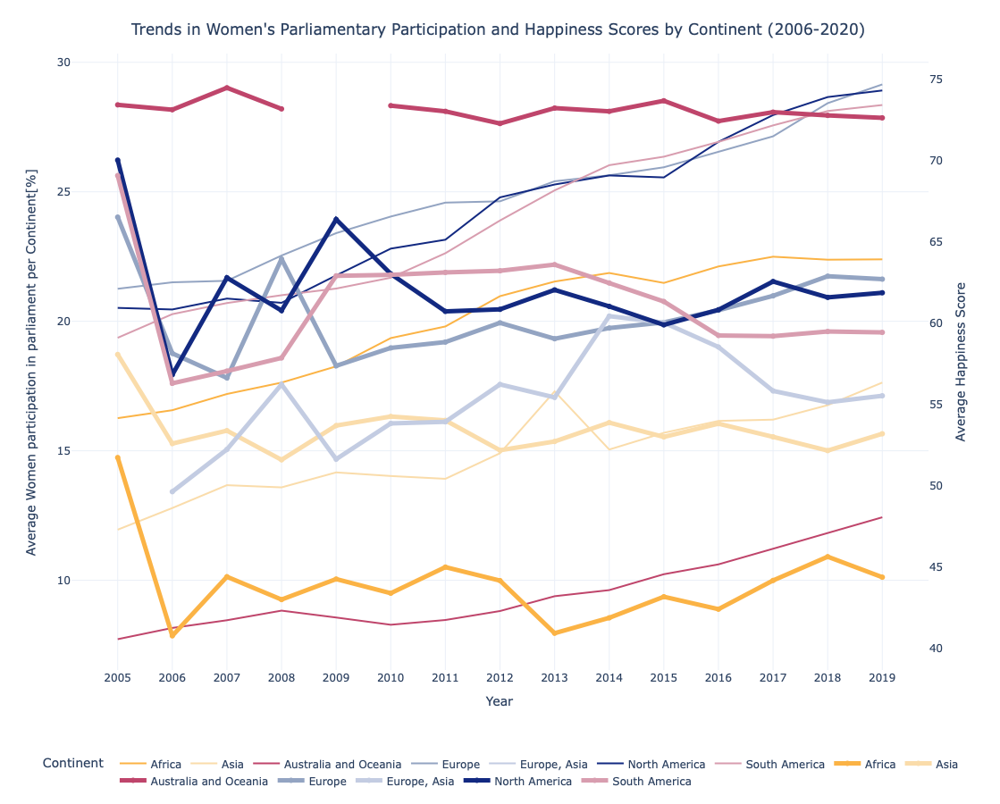

In [53]:
line_wom_happ = go.Figure(line_wom)

# Loop through each unique continent and add a trace for the happiness scores
for continent in average_participation['continent'].unique():
    # Filter data for the continent
    continent_data = average_participation[average_participation['continent'] == continent]
    # Add trace
    line_wom_happ.add_trace(
        go.Scatter(
            x=continent_data['year'],
            y=continent_data['happiness_score'],
            line=dict(color=continent_colors[continent], width=5),
            name=f'{continent}',  # Naming to differentiate
            yaxis='y2'  # This specifies the use of the secondary y-axis
        )
    )

# Update layout to add secondary y-axis
line_wom_happ.update_layout(
    title={
        'text': "Trends in Women's Parliamentary Participation and Happiness Scores by Continent (2006-2020)",
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    yaxis2=dict(
        title='Average Happiness Score',
        overlaying='y',  # Ensures the second y-axis overlays the first
        side='right',  # Positions the axis to the right side
        showgrid=False  # Optional: turns off grid for the second y-axis
    ),
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.2,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )

)

line_wom_happ.show()

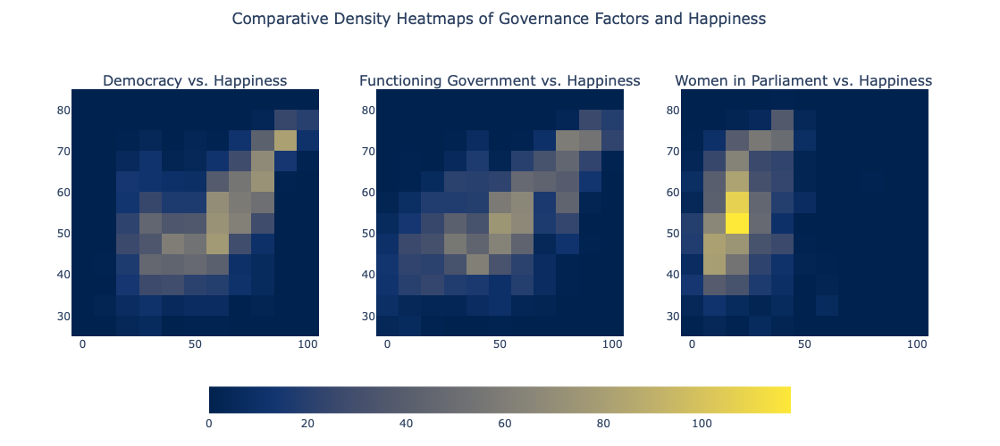

In [54]:
import plotly.express as px
from plotly.subplots import make_subplots

# Assuming happiness_gouv is properly formatted and loaded
heatmap_gouv1 = px.density_heatmap(happiness_gouv, x="democracy", y="happiness_score", title="Democracy vs. Happiness")
heatmap_gouv2 = px.density_heatmap(happiness_gouv, x="functioning_government", y="happiness_score", title="Functioning Government vs. Happiness")
heatmap_gouv3 = px.density_heatmap(happiness_gouv, x="women_parliament", y="happiness_score", title="Women in Parliament vs. Happiness")

# Correct the subplot titles and ensure using the correct subplot object
heat_sub_gouv = make_subplots(rows=1, cols=3, subplot_titles=("Democracy vs. Happiness", "Functioning Government vs. Happiness", "Women in Parliament vs. Happiness"))

# Add traces from each heatmap to the appropriate subplot
for i, heatmap in enumerate([heatmap_gouv1, heatmap_gouv2, heatmap_gouv3], start=1):
    for trace in heatmap.data:
        heat_sub_gouv.add_trace(trace, row=1, col=i)

# Update layout and color axis configuration correctly on the right subplot object
heat_sub_gouv.update_layout(
    coloraxis_colorbar=dict(
        orientation="h",  # Set colorbar to horizontal
        x=0.5,  # Center the colorbar horizontally relative to the plot
        xanchor="center",
        y=-0.4,  # Position it below the plot
        yanchor="bottom",
        len=0.7  # Adjust the length of the colorbar (optional)
    ),
    coloraxis_showscale=True,
    coloraxis=dict(colorscale='Cividis'),
    title_text='Comparative Density Heatmaps of Governance Factors and Happiness',
    title={'y': 0.97, 'x': 0.5, 'xanchor': 'center', 'yanchor': 'top'},
    height=500,
    width=1100
)

# Show the correct subplot object
heat_sub_gouv.show()


### OBSERVATION PER COUNTRIES (TOP 5 and BOTTOM 5)

In [55]:
# TOP 10
happiness.sort_values(by='avg_score', ascending=False).head(10)

,country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,country_code,continent,avg_score
47,Denmark,80.2,NaN,78.3,79.7,76.8,77.7,77.9,75.2,75.9,75.1,75.1,75.6,75.9,76.5,76.5,DNK,Europe,76.885714
56,Finland,NaN,76.7,NaN,76.7,NaN,73.9,73.5,74.2,74.4,73.8,74.5,76.6,77.9,78.6,78.1,FIN,Europe,75.741667
130,Norway,NaN,74.2,NaN,76.3,NaN,NaN,NaN,76.8,NaN,74.4,76.0,76.0,75.8,74.4,74.9,NOR,Europe,75.422222
30,Switzerland,NaN,74.7,NaN,NaN,75.2,NaN,NaN,77.8,NaN,74.9,75.7,74.6,74.7,75.1,75.6,CHE,Europe,75.366667
129,Netherlands,74.6,NaN,74.5,76.3,NaN,75.0,75.6,74.7,74.1,73.2,73.2,75.4,74.6,74.6,74.5,NLD,Europe,74.638462
82,Iceland,NaN,NaN,NaN,68.9,NaN,NaN,NaN,75.9,75.0,NaN,75.0,75.1,74.8,NaN,75.0,ISL,Europe,74.242857
29,Canada,74.2,NaN,74.8,74.9,74.9,76.5,74.3,74.2,75.9,73.0,74.1,72.4,74.1,71.8,72.3,CAN,North America,74.100000
165,Sweden,73.8,NaN,72.4,75.2,72.7,75.0,73.8,75.6,74.3,72.4,72.9,73.7,72.9,73.7,73.5,SWE,Europe,73.707143
133,New Zealand,NaN,73.1,76.0,73.8,NaN,72.2,71.9,72.5,72.8,73.1,74.2,72.3,73.3,73.7,73.0,NZL,Australia and Oceania,73.223077
8,Australia,73.4,NaN,72.9,72.5,NaN,74.5,74.1,72.0,73.6,72.9,73.1,72.5,72.6,71.8,72.2,AUS,Australia and Oceania,72.930769


In [56]:
# BOTTOM 10
happiness.sort_values(by='avg_score', ascending=True).head(10)

,country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,country_code,continent,avg_score
160,South Sudan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.3,40.7,28.9,28.2,NaN,28.2,SSD,Africa,32.860000
28,Central African Republic,NaN,NaN,41.6,NaN,NaN,35.7,36.8,NaN,NaN,NaN,NaN,26.9,34.8,NaN,34.8,CAF,Africa,35.100000
170,Togo,NaN,32.0,NaN,28.1,NaN,NaN,29.4,NaN,NaN,28.4,37.7,38.8,43.6,40.2,41.9,TGO,Africa,35.566667
11,Burundi,NaN,NaN,NaN,35.6,37.9,NaN,37.1,NaN,NaN,29.0,NaN,NaN,NaN,37.8,37.8,BDI,Africa,35.866667
0,Afghanistan,NaN,NaN,NaN,37.2,44.0,47.6,38.3,37.8,35.7,31.3,39.8,42.2,26.6,26.9,25.7,AFG,Asia,36.091667
149,Rwanda,NaN,42.1,NaN,43.6,40.3,NaN,41.0,33.3,34.7,36.0,34.8,33.3,31.1,35.6,33.1,RWA,Africa,36.575000
181,Tanzania,NaN,39.2,43.2,43.8,34.1,32.3,40.7,40.1,38.5,34.8,36.6,29.0,33.5,34.5,34.8,TZA,Africa,36.792857
193,Yemen,NaN,NaN,44.8,NaN,48.1,43.5,37.5,40.6,42.2,39.7,29.8,38.3,32.5,30.6,35.3,YEM,Asia,38.575000
38,Comoros,NaN,NaN,NaN,NaN,34.8,38.1,38.4,39.6,NaN,NaN,NaN,NaN,NaN,39.7,42.9,COM,Africa,38.916667
75,Haiti,NaN,37.5,NaN,38.5,NaN,37.7,48.4,44.1,46.2,38.9,35.7,33.5,38.2,36.1,37.2,HTI,North America,39.333333


TOP 10 
Denmark, Finland, Norway, Switzerland, Netherlands, Iceland, Canada, Sweden, New Zealand, Australia

BOTTOM 10 
Haiti, Comoros, Yemen, Tanzania, Rwanda, Afghanistan, Burundi, Togo, Central African Republic, Sudan

In [57]:
#making a color dict

top10 = ["Denmark", "Finland", "Norway", "Switzerland", "Netherlands",
                    "Iceland", "Canada", "Sweden", "New Zealand", "Australia"]
bottom10 = ["Haiti", "Comoros", "Yemen", "Tanzania", "Rwanda", 
                    "Afghanistan", "Burundi", "Togo", "Central African Republic", "Sudan"]

# Assign colors to each country in a dictionary
top_country_colors = {
    'Denmark': '#93A4C2',
    'Finland': '#93A4C2',
    'Norway': '#93A4C2',
    'Switzerland': '#93A4C2',
    'Netherlands': '#93A4C2',
    'Iceland': '#93A4C2',
    'Canada': '#122981',
    'Sweden': '#93A4C2',
    'New Zealand': '#BF456B',
    'Australia': '#BF456B',
    'Haiti': '#122981',
    'Comoros': '#FBB345',
    'Yemen': '#FADCAA',
    'Tanzania': '#FBB345',
    'Rwanda': '#FBB345',
    'Afghanistan': '#FADCAA',
    'Burundi': '#FBB345',
    'Togo': '#FBB345',
    'Central African Republic': '#FBB345',
    'Sudan': '#FBB345'
}


In [58]:
happiness_top10 = happiness.sort_values(by='avg_score', ascending=False)
happiness_top10 = happiness[happiness['country'].isin(top10)]
happiness_top10.sort_values(by='avg_score', ascending=False)
happiness_top10 = happiness_top10.reset_index(drop=True)

In [59]:
happiness_bottom10 = happiness[happiness['country'].isin(bottom10)]

In [60]:
happiness_bottom10.sort_values(by='avg_score', ascending=True)
happiness_bottom10 = happiness_bottom10.reset_index(drop=True)

In [61]:
happiness_bottom10

,country,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,country_code,continent,avg_score
0,Afghanistan,NaN,NaN,NaN,37.2,44.0,47.6,38.3,37.8,35.7,31.3,39.8,42.2,26.6,26.9,25.7,AFG,Asia,36.091667
1,Burundi,NaN,NaN,NaN,35.6,37.9,NaN,37.1,NaN,NaN,29.0,NaN,NaN,NaN,37.8,37.8,BDI,Africa,35.866667
2,Central African Republic,NaN,NaN,41.6,NaN,NaN,35.7,36.8,NaN,NaN,NaN,NaN,26.9,34.8,NaN,34.8,CAF,Africa,35.100000
3,Comoros,NaN,NaN,NaN,NaN,34.8,38.1,38.4,39.6,NaN,NaN,NaN,NaN,NaN,39.7,42.9,COM,Africa,38.916667
4,Haiti,NaN,37.5,NaN,38.5,NaN,37.7,48.4,44.1,46.2,38.9,35.7,33.5,38.2,36.1,37.2,HTI,North America,39.333333
5,Rwanda,NaN,42.1,NaN,43.6,40.3,NaN,41.0,33.3,34.7,36.0,34.8,33.3,31.1,35.6,33.1,RWA,Africa,36.575000
6,Sudan,NaN,NaN,NaN,NaN,44.5,44.4,43.1,45.5,NaN,41.4,NaN,NaN,NaN,NaN,NaN,SDN,Africa,43.780000
7,Togo,NaN,32.0,NaN,28.1,NaN,NaN,29.4,NaN,NaN,28.4,37.7,38.8,43.6,40.2,41.9,TGO,Africa,35.566667
8,Tanzania,NaN,39.2,43.2,43.8,34.1,32.3,40.7,40.1,38.5,34.8,36.6,29.0,33.5,34.5,34.8,TZA,Africa,36.792857
9,Yemen,NaN,NaN,44.8,NaN,48.1,43.5,37.5,40.6,42.2,39.7,29.8,38.3,32.5,30.6,35.3,YEM,Asia,38.575000


In [62]:
happ_top_bot = pd.concat([happiness_top10, happiness_bottom10], axis=0)
happ_top_bot = pd.melt(happ_top_bot, id_vars=['country', 'country_code', 'continent'], value_vars=[str(year) for year in range(2005, 2019)],
                  var_name='year', value_name='happiness_score')

In [63]:
happ_top_bot.head(50)

,country,country_code,continent,year,happiness_score
0,Australia,AUS,Australia and Oceania,2005,73.4
1,Canada,CAN,North America,2005,74.2
2,Switzerland,CHE,Europe,2005,NaN
3,Denmark,DNK,Europe,2005,80.2
4,Finland,FIN,Europe,2005,NaN
5,Iceland,ISL,Europe,2005,NaN
6,Netherlands,NLD,Europe,2005,74.6
7,Norway,NOR,Europe,2005,NaN
8,New Zealand,NZL,Australia and Oceania,2005,NaN
9,Sweden,SWE,Europe,2005,73.8


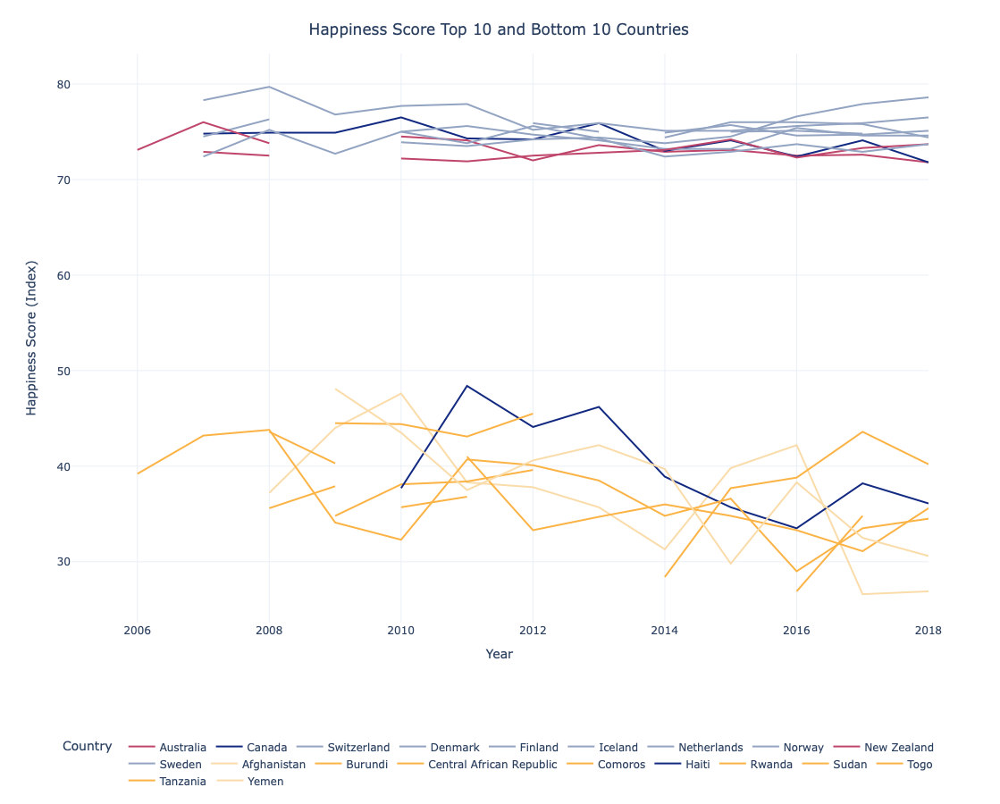

In [64]:
happ_top_bot['year'] = happ_top_bot['year'].astype(int)

line_top_bot = px.line(happ_top_bot, x='year', y='happiness_score', color='country', 
              color_discrete_map=top_country_colors,
                       labels={
                                'happiness_score': 'Happiness Score (Index) ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                           'country':'Country '
                          },
                hover_name='continent',
              markers=False)  # Include markers for each data point

line_top_bot.update_layout(
    title={
        'text': 'Happiness Score Top 10 and Bottom 10 Countries',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1050,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.3,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',

)

line_top_bot.show()


In [65]:
happiness_gouv_top10 = happiness_gouv[happiness_gouv['country'].isin(top10)]
happiness_gouv_bottom10 = happiness_gouv[happiness_gouv['country'].isin(bottom10)]
happiness_gouv_tb = pd.concat([happiness_gouv_top10, happiness_gouv_bottom10], axis=0)

In [66]:
happiness_income_top10 = happiness_income[happiness_income['country'].isin(top10)]
happiness_income_bottom10 = happiness_income[happiness_income['country'].isin(bottom10)]
happiness_income_tb = pd.concat([happiness_income_top10, happiness_income_bottom10], axis=0)

In [67]:
happiness_gouv_tb

,country,country_code,continent,year,happiness_score,women_parliament,democracy,functioning_government
8,Australia,AUS,Australia and Oceania,2005,73.4,28.80,NaN,NaN
29,Canada,CAN,North America,2005,74.2,35.50,NaN,NaN
30,Switzerland,CHE,Europe,2005,NaN,26.10,NaN,NaN
47,Denmark,DNK,Europe,2005,80.2,36.90,NaN,NaN
56,Finland,FIN,Europe,2005,NaN,40.30,NaN,NaN
...,...,...,...,...,...,...,...,...
2907,Rwanda,RWA,Africa,2019,33.1,55.70,31.6,42.9
2909,Sudan,SDN,Africa,2019,NaN,NaN,27.0,17.9
2928,Togo,TGO,Africa,2019,41.9,16.50,33.0,17.9
2939,Tanzania,TZA,Africa,2019,34.8,36.90,51.6,50.0


In [68]:
hap_tb = pd.merge(happiness_gouv_tb, happiness_income_tb, on=['country','country_code','continent','year', 'happiness_score'], how='inner')

In [69]:
hap_tb

,country,country_code,continent,year,happiness_score,women_parliament,democracy,functioning_government,avg_daily_income,income_inequality,population
0,Australia,AUS,Australia and Oceania,2005,73.4,28.80,NaN,NaN,46.80,33.6,20394800.0
1,Canada,CAN,North America,2005,74.2,35.50,NaN,NaN,52.20,33.8,32243753.0
2,Denmark,DNK,Europe,2005,80.2,36.90,NaN,NaN,48.00,25.2,5419432.0
3,Netherlands,NLD,Europe,2005,74.6,36.00,NaN,NaN,47.20,29.1,16319868.0
4,Sweden,SWE,Europe,2005,73.8,46.40,NaN,NaN,41.50,26.8,9029572.0
...,...,...,...,...,...,...,...,...,...,...,...
207,Haiti,HTI,North America,2019,37.2,2.74,45.7,20.7,4.79,60.5,11263079.0
208,Rwanda,RWA,Africa,2019,33.1,55.70,31.6,42.9,2.91,43.7,12626938.0
209,Togo,TGO,Africa,2019,41.9,16.50,33.0,17.9,2.96,43.0,8082359.0
210,Tanzania,TZA,Africa,2019,34.8,36.90,51.6,50.0,2.84,40.5,58005461.0


In [70]:
happiness_total_avg = pd.concat([happiness_top10, happiness_bottom10], axis=0)

In [71]:
happiness_total_avg = happiness_total_avg[['country','avg_score']]
happiness_total_avg

,country,avg_score
0,Australia,72.930769
1,Canada,74.100000
2,Switzerland,75.366667
3,Denmark,76.885714
4,Finland,75.741667
5,Iceland,74.242857
6,Netherlands,74.638462
7,Norway,75.422222
8,New Zealand,73.223077
9,Sweden,73.707143


In [72]:
happiness_continent_avg = happiness.groupby('continent')['avg_score'].mean()
happiness_continent_avg = happiness_continent_avg.reset_index(name='avg_score')
happiness_continent_avg

,continent,avg_score
0,Africa,43.692232
1,Asia,53.403565
2,Australia and Oceania,73.076923
3,Europe,60.579345
4,"Europe, Asia",55.300000
5,North America,60.777143
6,South America,60.789423


In [73]:
hap_tb = pd.merge(hap_tb, happiness_total_avg, how='outer', on='country')

In [74]:
hap_tb = hap_tb.sort_values(by='avg_score', ascending=True)

In [75]:
hap_top = hap_tb[hap_tb['country'].isin(top10)]
hap_top = hap_top.sort_values(by='avg_score', ascending=False)
hap_bottom = hap_tb[hap_tb['country'].isin(bottom10)]
hap_bottom = hap_bottom.sort_values(by='avg_score', ascending=True)

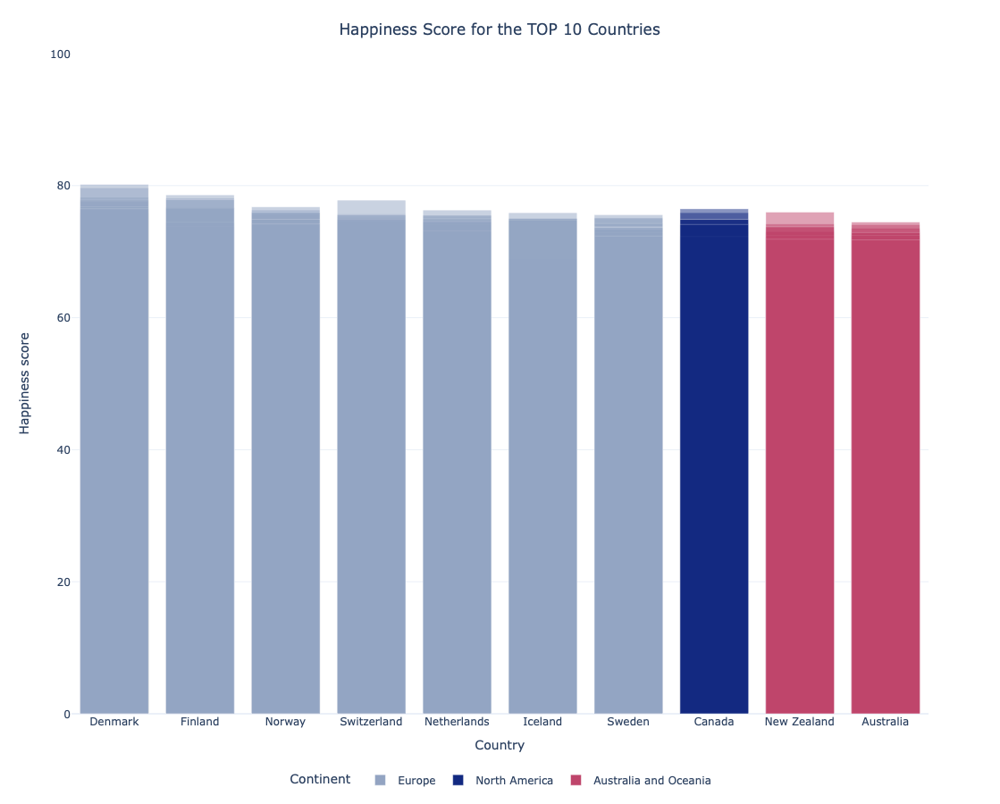

In [76]:
top_10 = px.bar(hap_top,
                        x='country',
                            y='happiness_score',
                          labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },
                            color='continent',
                          barmode='overlay',
                          color_discrete_map=continent_colors,
                          hover_name='country'
                         ,range_y=[0,100]
                  )

top_10.update_layout(
    title={
        'text': 'Happiness Score for the TOP 10 Countries',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.12,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
)



top_10.show()

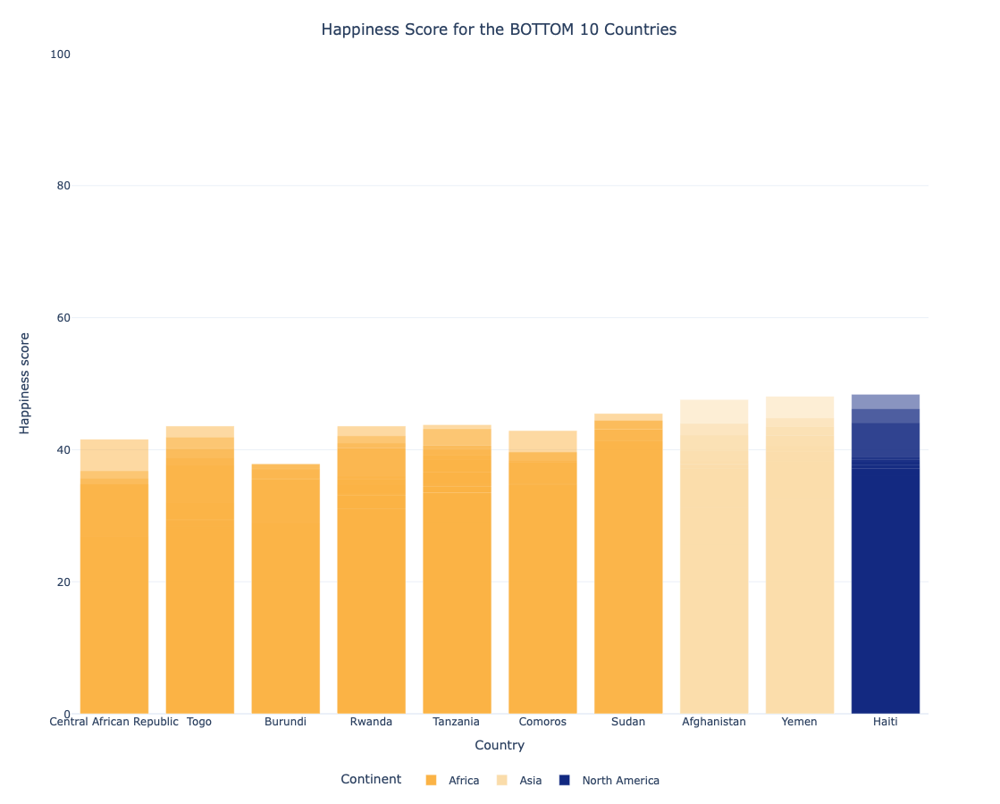

In [77]:
bottom_10 = px.bar(hap_bottom,
                        x='country',
                            y='happiness_score',
                          labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },
                            color='continent',
                          barmode='overlay',
                          color_discrete_map=continent_colors,
                          hover_name='country'
                         ,range_y=[0,100]
                  )

bottom_10.update_layout(
    title={
        'text': 'Happiness Score for the BOTTOM 10 Countries',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.12,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
)



bottom_10.show()

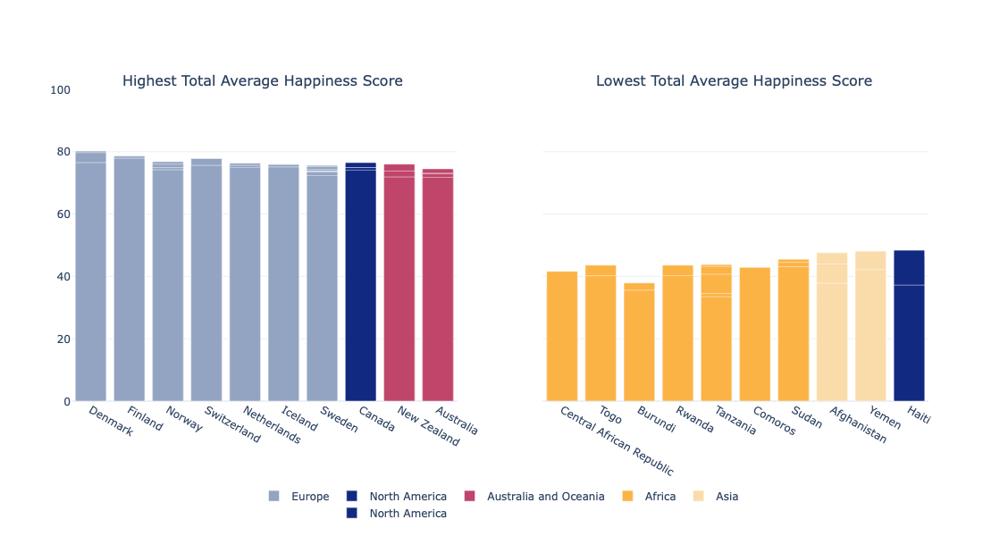

In [78]:
# Assuming hap_top and hap_bottom DataFrames are already defined
# Assuming continent_colors is defined

# Create a figure with a subplot grid of 1 row by 2 columns
fig = make_subplots(rows=1, cols=2, subplot_titles=('Highest Total Average Happiness Score', 
                                                     'Lowest Total Average Happiness Score'), shared_yaxes=True)

# First plot for TOP 10 Countries
top_10 = px.bar(hap_top,
                        x='country',
                            y='happiness_score',
                          labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },
                            color='continent',
                          color_discrete_map=continent_colors,
                          hover_name='country'
                  )

# Second plot for BOTTOM 10 Countries
bottom_10 = px.bar(hap_bottom,
                        x='country',
                            y='happiness_score',
                          labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },
                            color='continent',
                          color_discrete_map=continent_colors,
                          hover_name='country'
                  )

# Add the top 10 plot to the first column of the subplot
for trace in top_10.data:
    trace.showlegend = True
    fig.add_trace(trace, row=1, col=1)

# Add the bottom 10 plot to the second column of the subplot
for trace in bottom_10.data:
    trace.showlegend = True
    fig.add_trace(trace, row=1, col=2)

fig.update_yaxes(range=[0, 100], row=1, col=1)
fig.update_yaxes(range=[0, 100], row=1, col=2)

# Update layout
fig.update_layout(
    barmode='overlay',
    height=600, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.4,  # Places legend below the x-axis
        xanchor="center",
        x=0.5 ))

# Show the figure
fig.show()


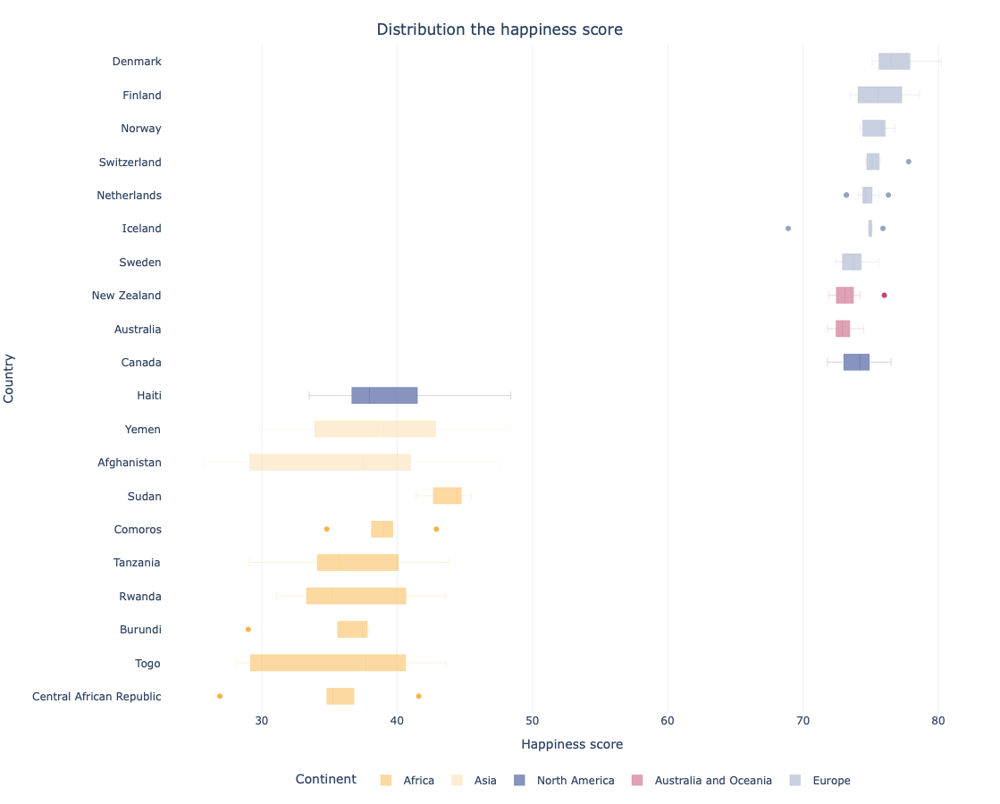

In [79]:
box_top = px.box(hap_tb,
                        y='country',
                            x='happiness_score',
                          labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },
                            color='continent',
                          color_discrete_map=continent_colors,
                          hover_name='country'
                         #,range_y=[0,100]
                  )

box_top.update_layout(
    boxmode='overlay',
    title={
        'text': 'Distribution the happiness score',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.12,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    ),
    margin=dict(l=20, r=20, t=50, b=20)
)

box_top.update_traces(line=dict( width=0.2))

box_top.show()

In [80]:
happiness = pd.melt(happiness, id_vars=['country', 'country_code', 'continent', 'avg_score'], value_vars=[str(year) for year in range(2005, 2019)],
                  var_name='year', value_name='happiness_score')

In [81]:
happiness_sorted = happiness.sort_values(by='avg_score', ascending=True)

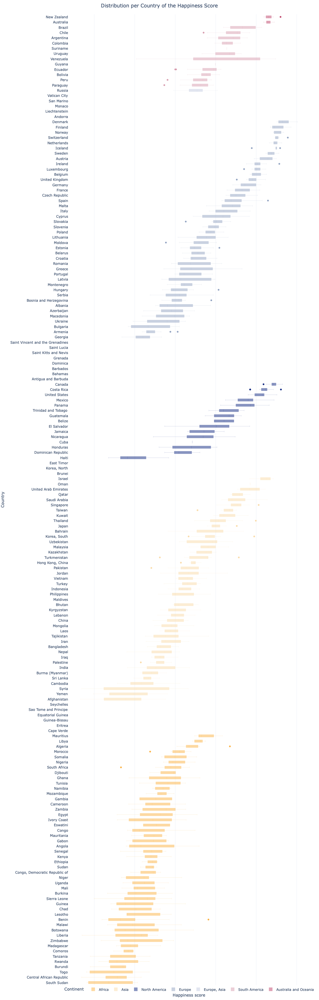

In [82]:
box_all = px.box(happiness_sorted,
                        y='country',
                            x='happiness_score',
                          labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },
                            color='continent',
                          color_discrete_map=continent_colors,
                          hover_name=None
                         #,range_y=[0,100]
                  )

box_all.update_layout(
    boxmode='overlay',
    title={
        'text': 'Distribution per Country of the Happiness Score',
        'y': 0.996,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=3500, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="top",
        y=0,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    ),
    margin=dict(l=20, r=20, t=50, b=20)
)

box_all.update_traces(line=dict( width=0.2))

box_all.show()

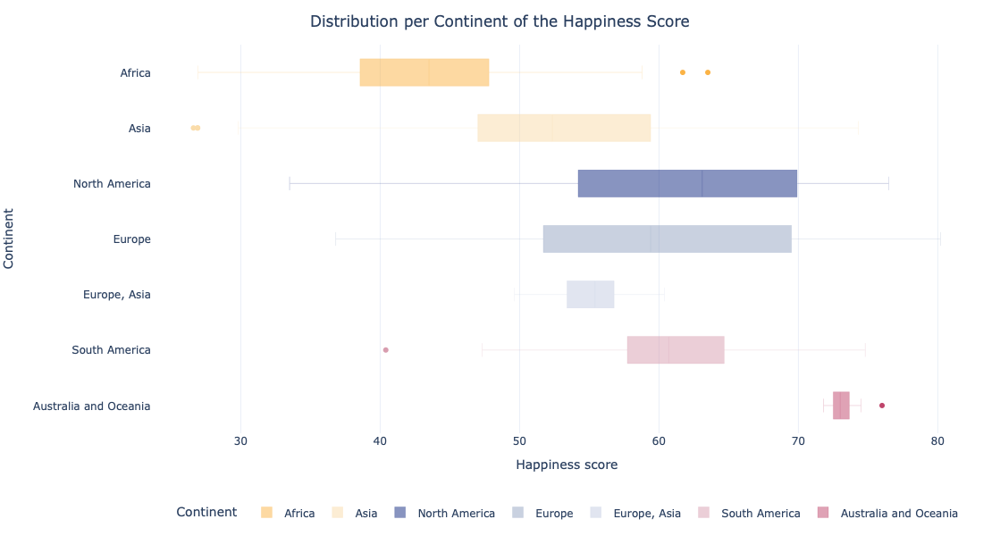

In [83]:
box_all = px.box(happiness_sorted,
                        y='continent',
                            x='happiness_score',
                          labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },
                            color='continent',
                          color_discrete_map=continent_colors,
                          hover_name=None
                         #,range_y=[0,100]
                  )

box_all.update_layout(
    boxmode='overlay',
    title={
        'text': 'Distribution per Continent of the Happiness Score',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=600, 
    width=1000,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="top",
        y=-0.17,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    ),
    margin=dict(l=20, r=20, t=50, b=20)
)

box_all.update_traces(line=dict( width=0.2))

box_all.show()

##### Treemap

In [84]:
happiness_sorted

,country,country_code,continent,avg_score,year,happiness_score
948,South Sudan,SSD,Africa,32.86,2009,NaN
2327,South Sudan,SSD,Africa,32.86,2016,28.9
1145,South Sudan,SSD,Africa,32.86,2010,NaN
2130,South Sudan,SSD,Africa,32.86,2015,40.7
751,South Sudan,SSD,Africa,32.86,2008,NaN
...,...,...,...,...,...,...
2740,Tuvalu,TUV,Australia and Oceania,NaN,2018,NaN
2748,Vatican City,VAT,Europe,NaN,2018,NaN
2749,Saint Vincent and the Grenadines,VCT,North America,NaN,2018,NaN
2752,Vanuatu,VUT,Australia and Oceania,NaN,2018,NaN


In [85]:
continent_avg_scores = happiness_sorted.groupby('continent').agg({
    'avg_score': 'mean'  # Calculate mean scores for each continent
}).reset_index()
continent_avg_scores.rename(columns={'avg_score': 'mean_happiness_score'}, inplace=True)

In [86]:
continent_avg_scores[continent_avg_scores['continent']=='Africa']

,continent,mean_happiness_score
0,Africa,43.692232


In [87]:
continent_avg_scores = happiness_gouv.groupby(['year','continent']).agg({
    'happiness_score': 'mean'  # Calculate mean scores for each continent
}).reset_index()
continent_avg_scores.rename(columns={'happiness_score': 'mean_year_score'}, inplace=True)

In [88]:
continent_count_distr = pd.merge(happiness_sorted, continent_avg_scores, on=['continent','year'], how='outer')
continent_count_distr

,country,country_code,continent,avg_score,year,happiness_score,mean_year_score
0,South Sudan,SSD,Africa,32.860000,2005,NaN,51.700000
1,Central African Republic,CAF,Africa,35.100000,2005,NaN,51.700000
2,Togo,TGO,Africa,35.566667,2005,NaN,51.700000
3,Burundi,BDI,Africa,35.866667,2005,NaN,51.700000
4,Rwanda,RWA,Africa,36.575000,2005,NaN,51.700000
...,...,...,...,...,...,...,...
2760,Colombia,COL,South America,62.728571,2018,59.8,59.455556
2761,Argentina,ARG,South America,63.307143,2018,57.9,59.455556
2762,Chile,CHL,South America,63.921429,2018,64.4,59.455556
2763,Brazil,BRA,South America,66.521429,2018,61.9,59.455556


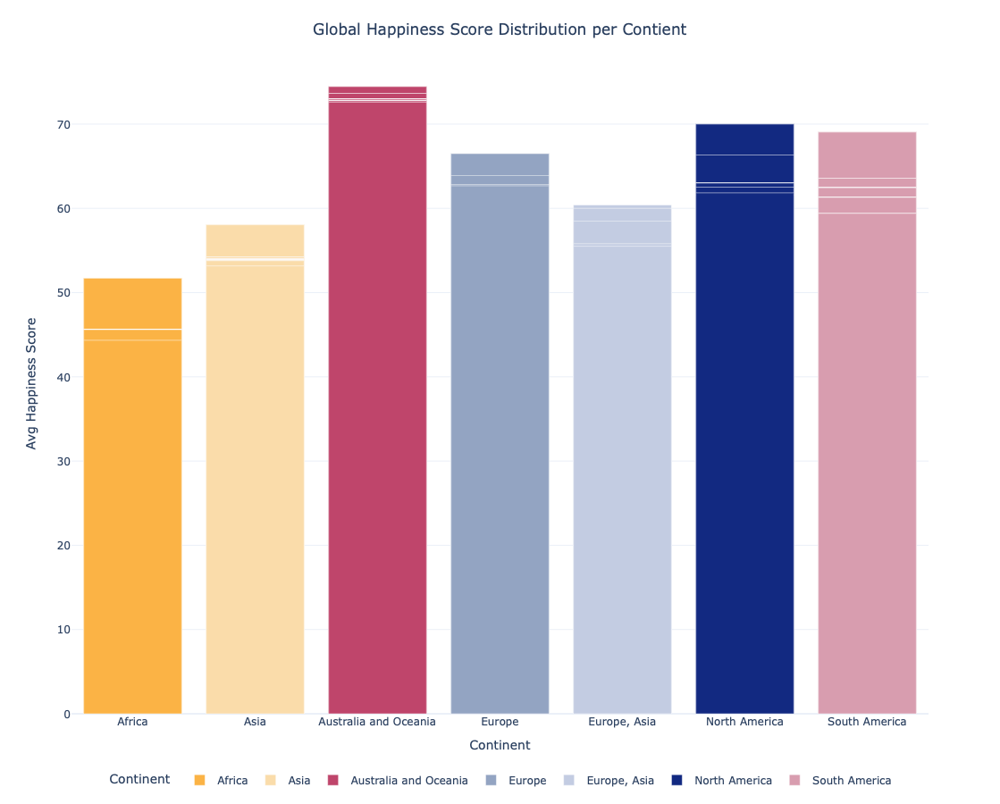

In [90]:
bar_avg_cont = px.bar(continent_count_distr,
                 x='continent',
                  y='mean_year_score',       # Size of segments based on happiness score
                  color='continent',              # Color segments by continent
                  color_discrete_map=continent_colors,
            labels={
                                'mean_year_score': 'Avg Happiness Score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },)  # Color scale: adjust if you use categorical coloring

bar_avg_cont.update_layout(
    title={
        'text': 'Global Happiness Score Distribution per Contient',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    barmode='overlay',
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.12,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
)


# Display the figure
bar_avg_cont.show()

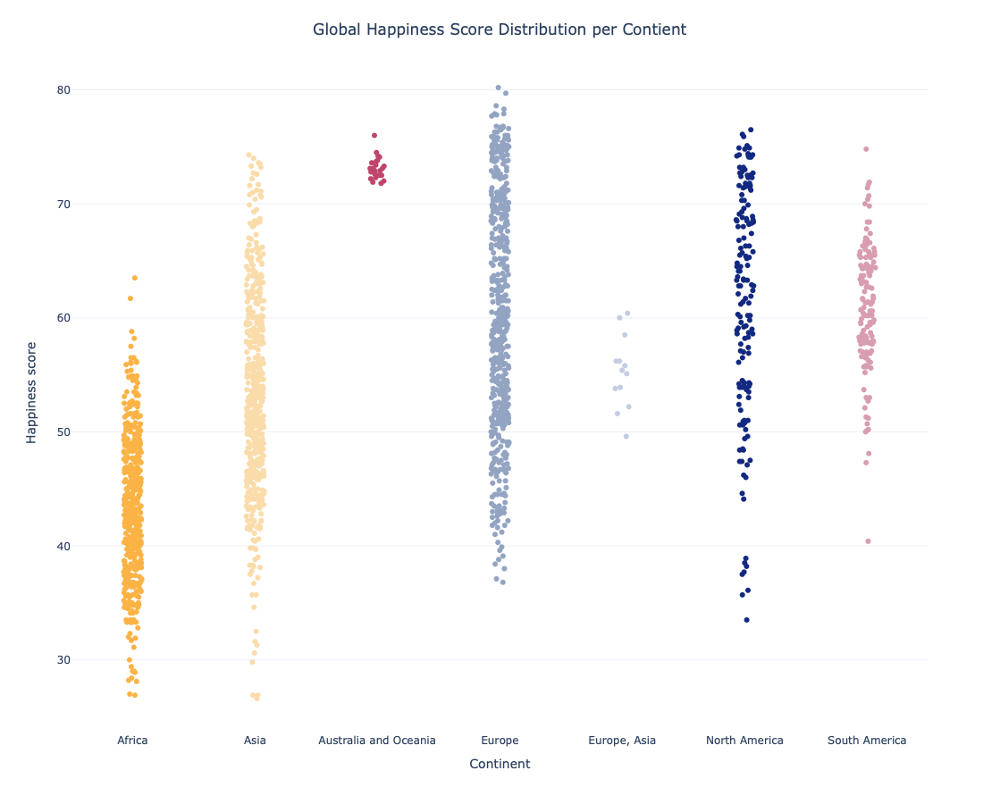

In [91]:
sun = px.strip(continent_count_distr,
                 x='continent',
                  y='happiness_score',       # Size of segments based on happiness score
                  color='continent',              # Color segments by continent
                  color_discrete_map=continent_colors,
            labels={
                                'happiness_score': 'Happiness score ',
                               'year': 'Year ',
                              'continent': ' Continent ',
                              'country' : 'Country'
                          },)  # Color scale: adjust if you use categorical coloring

sun.update_layout(
    title={
        'text': 'Global Happiness Score Distribution per Contient',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    #barmode='overlay',
    height=900, 
    width=1100,
    template='plotly_white',
    showlegend=False
)


# Display the figure
sun.show()

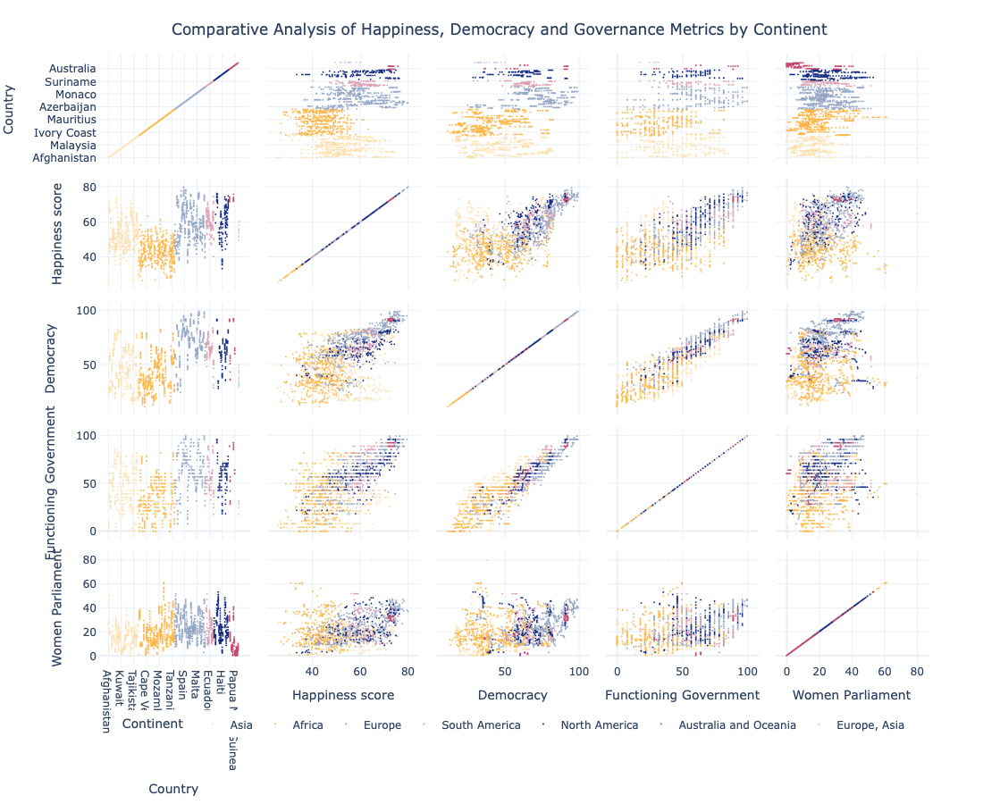

In [92]:
matrix_gouv = px.scatter_matrix(happiness_gouv,
                 dimensions=['country','happiness_score','democracy','functioning_government','women_parliament'],
                 # y='happiness_score',       # Size of segments based on happiness score
                  color='continent',              # Color segments by continent
                  color_discrete_map=continent_colors,
            labels={
                                'happiness_score': 'Happiness score ',
                               'democracy': 'Democracy ',
                              'continent': ' Continent ',
                              'country' : 'Country',
                                'functioning_government':'Functioning Government',
                                'women_parliament':'Women Parliament'
                          },)  # Color scale: adjust if you use categorical coloring

matrix_gouv.update_layout(
    title={
        'text': 'Comparative Analysis of Happiness, Democracy and Governance Metrics by Continent',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    #barmode='overlay',
    height=900, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.12,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
)

matrix_gouv.update_traces(marker=dict(size=2))


# Display the figure
matrix_gouv.show()

In [93]:
happiness_income

,country,country_code,continent,year,happiness_score,avg_daily_income,income_inequality,population
7,Antigua and Barbuda,ATG,North America,2005,NaN,20.50,37.2,81462.0
18,Bahamas,BHS,North America,2005,NaN,38.30,44.0,889157.0
21,Belize,BLZ,North America,2005,64.5,9.74,53.0,283798.0
24,Barbados,BRB,North America,2005,64.5,17.30,44.5,276320.0
29,Canada,CAN,North America,2005,74.2,52.20,33.8,32243753.0
...,...,...,...,...,...,...,...,...
2933,Tonga,TON,Australia and Oceania,2019,73.0,11.00,37.6,104497.0
2937,Tuvalu,TUV,Australia and Oceania,2019,73.0,10.20,39.1,11655.0
2949,Vanuatu,VUT,Australia and Oceania,2019,73.0,4.82,37.6,299882.0
2950,Samoa,WSM,Australia and Oceania,2019,73.0,10.60,38.7,197093.0


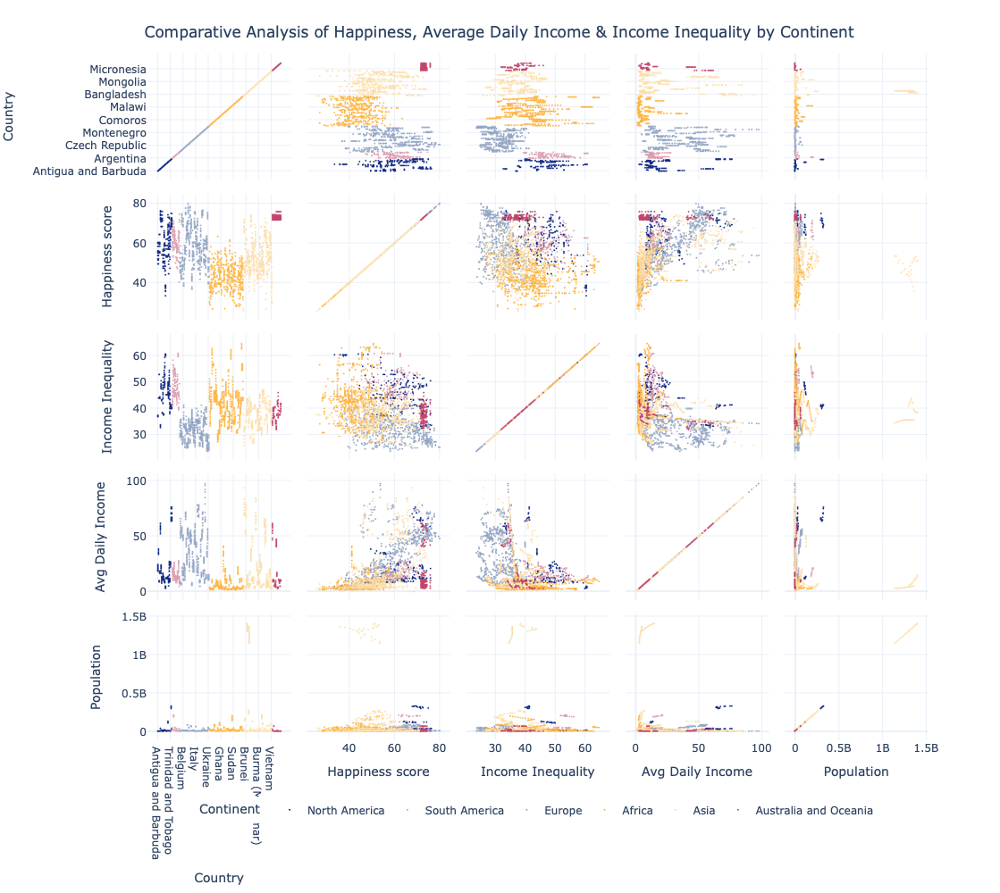

In [94]:
matrix_income = px.scatter_matrix(happiness_income,
                 dimensions=['country','happiness_score','income_inequality','avg_daily_income','population'],
                 # y='happiness_score',       # Size of segments based on happiness score
                  color='continent',              # Color segments by continent
                  color_discrete_map=continent_colors,
            labels={
                                'happiness_score': 'Happiness score ',
                               'income_inequality': 'Income Inequality ',
                              'avg_daily_income': ' Avg Daily Income ',
                              'country' : 'Country',
                                'population':'Population ',
                                'continent':'Continent '
                          },)  # Color scale: adjust if you use categorical coloring

matrix_income.update_layout(
    title={
        'text': 'Comparative Analysis of Happiness, Average Daily Income & Income Inequality by Continent',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    #barmode='overlay',
    height=1000, 
    width=1100,
    template='plotly_white',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.12,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )
)

matrix_income.update_traces(marker=dict(size=2))


# Display the figure
matrix_income.show()

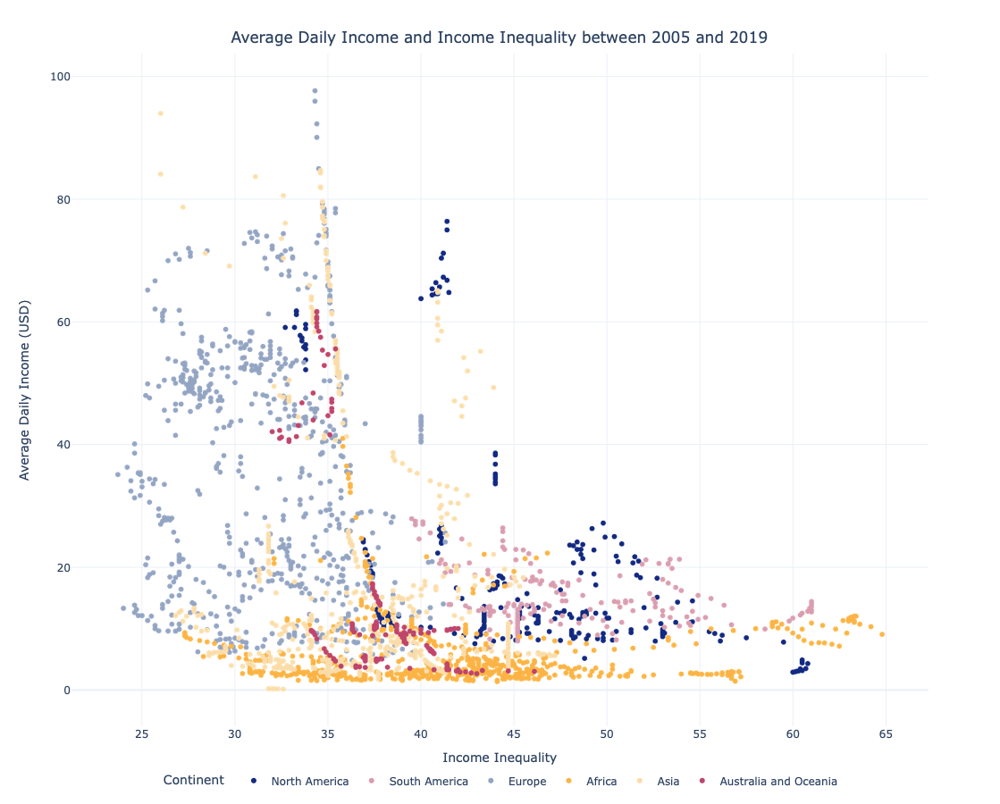

In [95]:
#with the actual data 

scatt_income = px.scatter(happiness_income,
                            x='income_inequality',
                            y='avg_daily_income',
                          labels={
                              'avg_daily_income': 'Average Daily Income (USD)',
                              'income_inequality': 'Income Inequality',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            #size='population',
                          #size_max=50,
                            color='continent',
                             #animation_frame="year",
                          color_discrete_map=continent_colors,
                          hover_name='country',
                        # range_y=[0,100],
                          #range_x=[0,100]
                         )

scatt_income.update_layout(
    title={
        'text': 'Average Daily Income and Income Inequality between 2005 and 2019',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=900,
    template='plotly_white',
    #plot_bgcolor='rgba(0, 0, 0, 0)',
     #paper_bgcolor='rgba(0, 0, 0, 0)',
    legend=dict(
        orientation="h",  # Horizontal layout
        yanchor="bottom",
        y=-0.1,  # Places legend below the x-axis
        xanchor="center",
        x=0.5   # Centers the legend
    )

)

scatt_income.update_traces(marker=dict(size=6,
                              #line=dict(width=0.5,
                               #         color='DarkSlateGrey'),
                                      ))


#scatt_income.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

scatt_income.show()

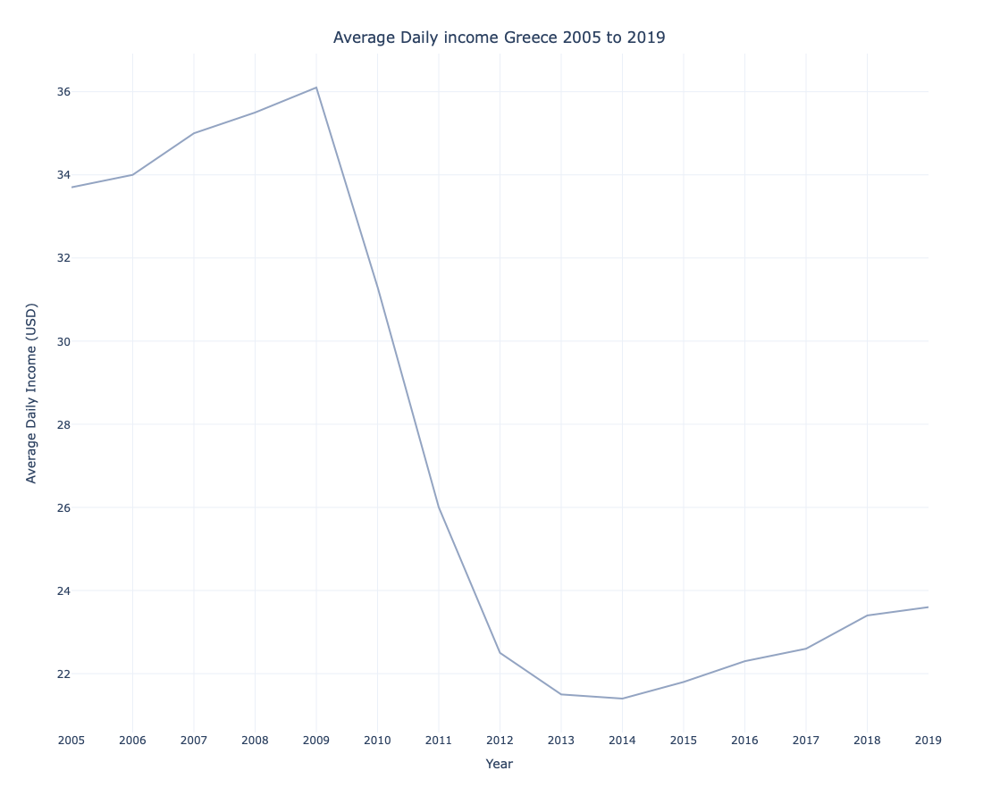

In [96]:
import plotly.express as px

# Ensure the data is sorted by year
happiness_income_sorted = happiness_income.sort_values(['year'])

greece_data = happiness_income_sorted[happiness_income_sorted['country'] == 'Greece']


# Plotting the average daily income over years
avg_income_year = px.line(greece_data,
                          x='year',
                          y='avg_daily_income',
                          labels={
                              'avg_daily_income': 'Average Daily Income (USD)',
                              'year': 'Year'
                          },
                          color='country',
                          color_discrete_map=country_colors,
                          hover_name='country',
                         #range_y=[0,100]
                         )

# Updating layout to modify title and dimensions, and ensure legend is hidden
avg_income_year.update_layout(
    title={
        'text': 'Average Daily income Greece 2005 to 2019',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900,
    width=1100,
    template='plotly_white',
    showlegend=False  # Hides the legend
)

# Optional: Update trace settings if needed
avg_income_year.update_traces(marker=dict(size=2))

# Show the plot
avg_income_year.show()


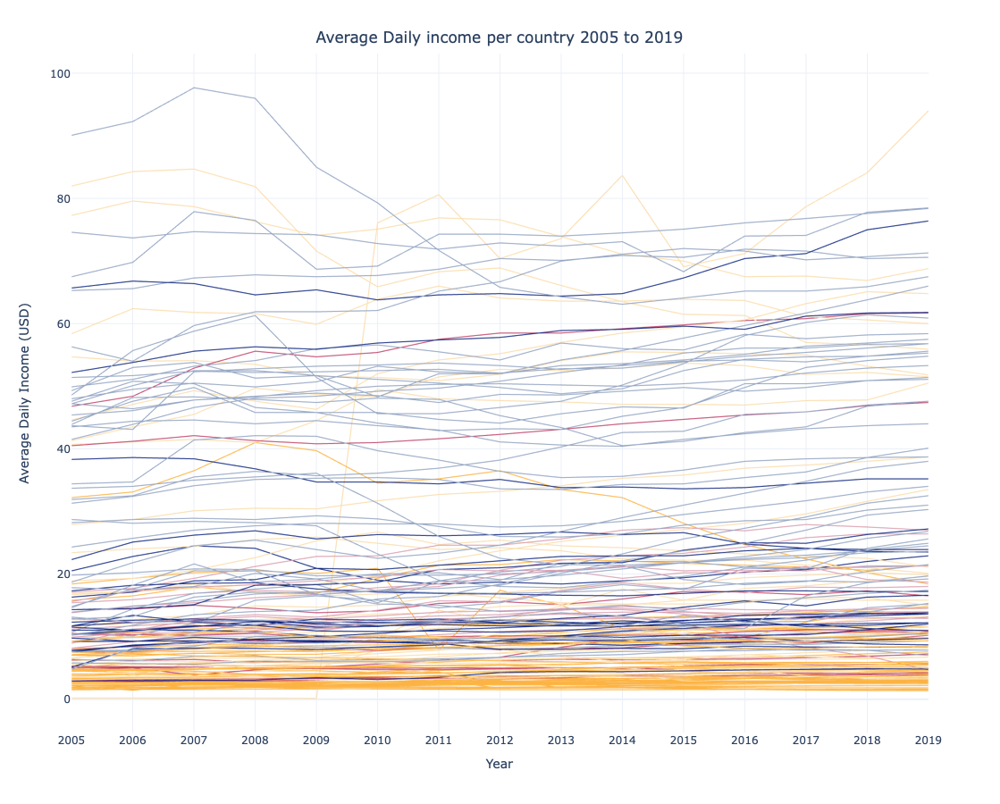

In [97]:
import plotly.express as px

# Ensure the data is sorted by year
happiness_income_sorted = happiness_income.sort_values(['year'])

greece_data = happiness_income_sorted[happiness_income_sorted['country'] == 'Greece']


# Plotting the average daily income over years
avg_income_year = px.line(happiness_income_sorted,
                          x='year',
                          y='avg_daily_income',
                          labels={
                              'avg_daily_income': 'Average Daily Income (USD)',
                              'year': 'Year'
                          },
                          color='country',
                          color_discrete_map=country_colors,
                          hover_name='country')

# Updating layout to modify title and dimensions, and ensure legend is hidden
avg_income_year.update_layout(
    title={
        'text': 'Average Daily income per country 2005 to 2019',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900,
    width=1100,
    template='plotly_white',
    showlegend=False  # Hides the legend
)

# Optional: Update trace settings if needed
avg_income_year.update_traces(line=dict(width=1))

# Show the plot
avg_income_year.show()


In [98]:
happiness_income['country'].unique()

array(['Antigua and Barbuda', 'Bahamas', 'Belize', 'Barbados', 'Canada',
       'Costa Rica', 'Cuba', 'Dominica', 'Dominican Republic', 'Grenada',
       'Guatemala', 'Honduras', 'Haiti', 'Jamaica',
       'Saint Kitts and Nevis', 'Saint Lucia', 'Mexico', 'Nicaragua',
       'Panama', 'El Salvador', 'Trinidad and Tobago', 'United States',
       'Saint Vincent and the Grenadines', 'Argentina', 'Bolivia',
       'Brazil', 'Chile', 'Colombia', 'Ecuador', 'Guyana', 'Peru',
       'Paraguay', 'Suriname', 'Uruguay', 'Venezuela', 'Albania',
       'Andorra', 'Armenia', 'Austria', 'Azerbaijan', 'Belgium',
       'Bulgaria', 'Bosnia and Herzegovina', 'Belarus', 'Switzerland',
       'Cyprus', 'Czech Republic', 'Germany', 'Denmark', 'Spain',
       'Estonia', 'Finland', 'France', 'United Kingdom', 'Georgia',
       'Greece', 'Croatia', 'Hungary', 'Ireland', 'Iceland', 'Italy',
       'Liechtenstein', 'Lithuania', 'Luxembourg', 'Latvia', 'Monaco',
       'Moldova', 'Macedonia', 'Malta', 'Montene

In [99]:
selected_countries = ['China', 'Indonesia', 'Croatia', 'France', 'Germany', 'Lithuania', 
                      'Netherlands', 'Poland', 'Spain', 'Turkey', 'New Zealand', 'Kenya']

In [100]:
filter_hap_income = happiness_income[happiness_income['country'].isin(selected_countries)]
filter_hap_income['country'] = pd.Categorical(filter_hap_income['country'], categories=selected_countries, ordered=True)
filter_hap_income = filter_hap_income.sort_values(['year','country'])

# filter_happ_income_sorted = filter_happ_income.reset_index(drop=True

/var/folders/m1/dk0h8kz11p9g8_szsqwqhdnc0000gn/T/ipykernel_39347/2873704562.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [101]:
filter_hap_income

,country,country_code,continent,year,happiness_score,avg_daily_income,income_inequality,population
32,China,CHN,Asia,2005,45.6,5.03,40.9,1.303720e+09
77,Indonesia,IDN,Asia,2005,49.5,3.73,33.0,2.262895e+08
74,Croatia,HRV,Europe,2005,58.2,28.70,30.6,4.310145e+06
58,France,FRA,Europe,2005,70.9,43.70,29.8,6.317936e+07
44,Germany,DEU,Europe,2005,66.2,51.40,32.1,8.246942e+07
...,...,...,...,...,...,...,...,...
2899,Poland,POL,Europe,2019,61.9,19.20,30.2,3.796548e+07
2811,Spain,ESP,Europe,2019,64.0,38.70,34.7,4.713484e+07
2936,Turkey,TUR,Asia,2019,51.3,19.90,41.9,8.342961e+07
2891,New Zealand,NZL,Australia and Oceania,2019,73.0,47.40,35.2,4.979300e+06


In [102]:
filter_hap_gouv = happiness_gouv[happiness_gouv['country'].isin(selected_countries)]
filter_hap_gouv['country'] = pd.Categorical(filter_hap_gouv['country'], categories=selected_countries, ordered=True)
filter_hap_gouv = filter_hap_gouv.sort_values(['year','country'])

# filter_happ_income_sorted = filter_happ_income.reset_index(drop=True

/var/folders/m1/dk0h8kz11p9g8_szsqwqhdnc0000gn/T/ipykernel_39347/2261117557.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [103]:
filter_hap_gouv

,country,country_code,continent,year,happiness_score,women_parliament,democracy,functioning_government
32,China,CHN,Asia,2005,NaN,NaN,NaN,NaN
77,Indonesia,IDN,Asia,2005,NaN,13.3,NaN,NaN
74,Croatia,HRV,Europe,2005,NaN,19.3,NaN,NaN
58,France,FRA,Europe,2005,70.9,15.3,NaN,NaN
44,Germany,DEU,Europe,2005,66.2,31.8,NaN,NaN
...,...,...,...,...,...,...,...,...
2899,Poland,POL,Europe,2019,61.9,27.9,66.2,60.7
2811,Spain,ESP,Europe,2019,64.0,41.9,82.9,71.4
2936,Turkey,TUR,Asia,2019,51.3,17.4,40.9,50.0
2891,New Zealand,NZL,Australia and Oceania,2019,73.0,40.8,92.6,92.9


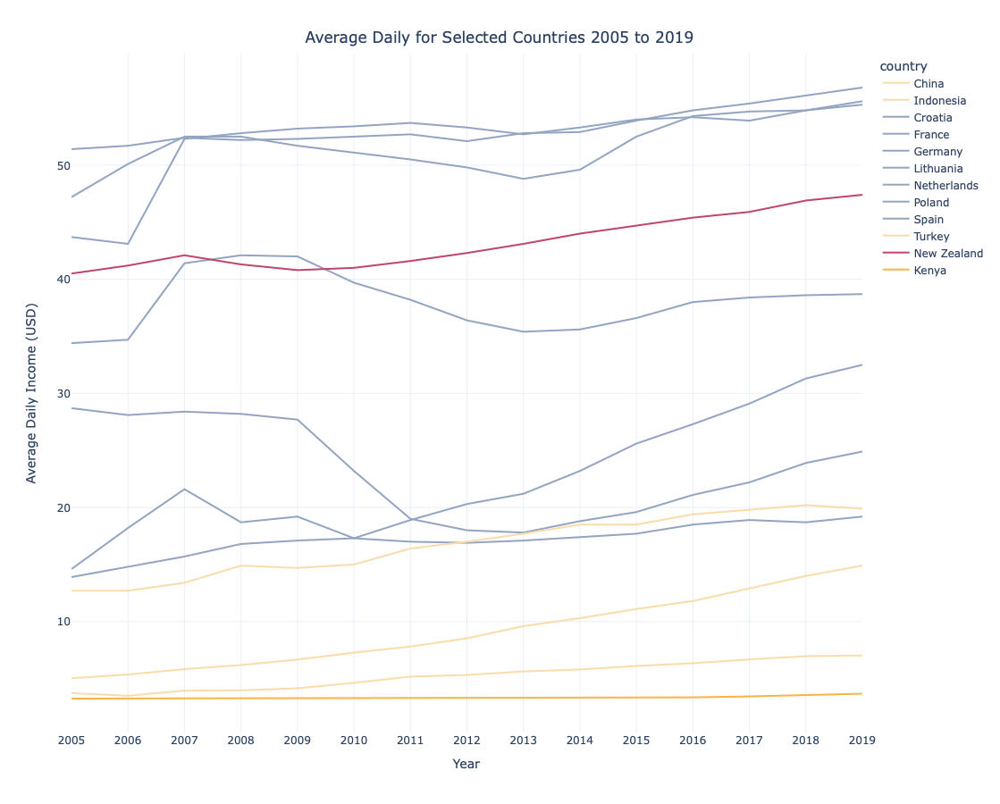

In [104]:
# Plotting the average daily income over years
avg_income_year = px.line(filter_hap_income,
                          x='year',
                          y='avg_daily_income',
                          labels={
                              'avg_daily_income': 'Average Daily Income (USD)',
                              'year': 'Year'
                          },
                          color='country',
                          color_discrete_map=country_colors,
                          hover_name='country')

# Updating layout to modify title and dimensions, and ensure legend is hidden
avg_income_year.update_layout(
    title={
        'text': 'Average Daily for Selected Countries 2005 to 2019',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900,
    width=1100,
    template='plotly_white',
    
)

# Optional: Update trace settings if needed
avg_income_year.update_traces(line=dict(width=2))

# Show the plot
avg_income_year.show()


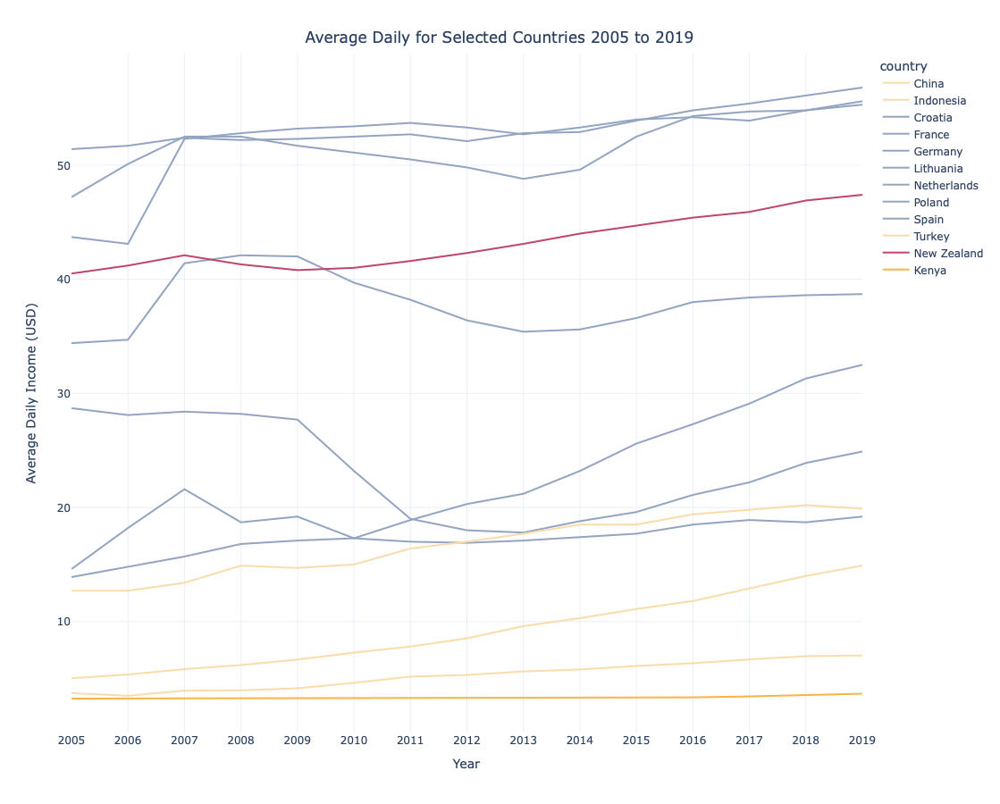

In [105]:
# Plotting the average daily income over years
happ_countr= px.line(filter_hap_income,
                          x='year',
                          y='happiness_score',
                          labels={
                              'happiness_score': 'Happiness Score',
                              'year': 'Year'
                          },
                           animation_frame="country",
                          color='country',
                          color_discrete_map=country_colors,
                          hover_name='country',
                         range_y=[36,78]
                         )
happ_countr.update_layout(
    title={
        'text': 'Evolution of Happiness Score per country',
        'y': 0.96,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900,
    width=1100,
    template='plotly_white',
    
)
happ_countr.update_traces(line=dict(width=2))

# Show the plot
avg_income_year.show()


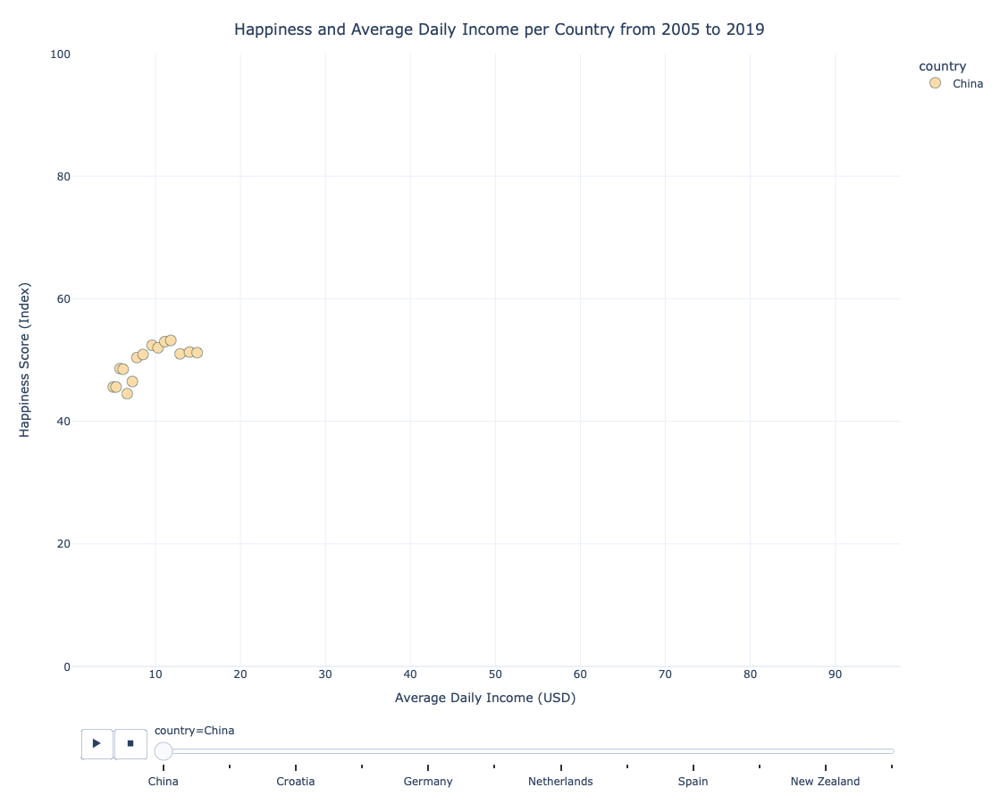

In [106]:
# With the filled data 

scatt_happ_avg_countr = px.scatter(filter_hap_income,
                            x='avg_daily_income',
                            y='happiness_score',
                            #size='population',
                          #size_max=50,
                          labels={
                              'avg_daily_income': 'Average Daily Income (USD)',
                              'happiness_score': 'Happiness Score (Index)',
                               'year': 'Year ',
                              'continent': ' Continent '
                          },
                            color='country',
                             animation_frame="country",
                          color_discrete_map=country_colors,
                          hover_name='country',
                         range_y=[0,100],
                        range_x=[happiness_income['avg_daily_income'].min(), happiness_income['avg_daily_income'].max()])

scatt_happ_avg_countr.update_layout(
    title={
        'text': 'Happiness and Average Daily Income per Country from 2005 to 2019',
        'y': 0.97,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    height=900, 
    width=1100,
    template='plotly_white',
    showlegend=None

)

scatt_happ_avg_countr.update_traces(marker=dict(size=12,
                              line=dict(width=0.5,
                                        color='DarkSlateGrey'),
                                      ))


scatt_happ_avg_countr.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1000

scatt_happ_avg_countr.show()




In [107]:
bar_avg_cont = './visu/bar_avg_cont.png'

In [108]:
bar_avg_cont

'./visu/bar_avg_cont.png'

![title](./visu/bar_avg_cont.png)